# The Reuters corpus

Revisit the Reuters C50 text corpus that we briefly explored in class. Your task is simple: tell an interesting story, anchored in some analytical tools we have learned in this class, using this data. For example:
- you could cluster authors or documents and tell a story about what you find.
- you could look for common factors using PCA.
- you could train a predictive model and assess its accuracy, constructing features for each document that maximize performance.
- you could do anything else that strikes you as interesting with this data.
- Describe clearly what question you are trying to answer, what models you are using, how you pre-processed the data, and so forth. Make sure you include at least one really interesting plot (although more than one might be necessary, depending on your question and approach.)

Format your write-up in the following sections, some of which might be quite short:
- Question: What question(s) are you trying to answer?
- Approach: What approach/statistical tool did you use to answer the questions?
- Results: What evidence/results did your approach provide to answer the questions? (E.g. any numbers, tables, figures as appropriate.)
- Conclusion: What are your conclusions about your questions? Provide a written interpretation of your results, understandable to stakeholders who might plausibly take an interest in this data set.


Regarding the data itself: In the C50train directory, you have 50 articles from each of 50 different authors (one author per directory). Then in the C50test directory, you have another 50 articles from each of those same 50 authors (again, one author per directory). This train/test split is obviously intended for building predictive models, but to repeat, you need not do that on this problem. You can tell any story you want using any methods you want. Just make it compelling!

Note: if you try to build a predictive model, you will need to figure out a way to deal with words in the test set that you never saw in the training set. This is a nontrivial aspect of the modeling exercise. (E.g. you might simply ignore those new words.)

This question will be graded according to three criteria:
- the overall "interesting-ness" of your question and analysis.
- the clarity of your description. We will be asking ourselves: could your analysis be reproduced by a competent data scientist based on what you've said? (That's good.) Or would that person have to wade into the code in order to understand what, precisely, you've done? (That's bad.)
- technical correctness (i.e. did you make any mistakes in execution or interpretation?)

### Validating Data

First step was just making sure the data was migrated correctly. I wanted to make sure there were no missing articles or authors, and that the files were set up correctly. This script simply goes into the folder, checks that there are 50 authors in each of the train and test set, then confirms that each author has 50 articles associated with them. Doesn't check the contents of any files, just the overall structure.

In [1]:
import os

def validate_reuters_c50_structure(data_path):
    c50train_path = os.path.join(data_path, 'C50train')
    c50test_path = os.path.join(data_path, 'C50test')
    if not os.path.exists(c50train_path):
        print(f"Error: '{c50train_path}' does not exist.")
        return False
    if not os.path.exists(c50test_path):
        print(f"Error: '{c50test_path}' does not exist.")
        return False
    
    def validate_author_folders(folder_path):
        authors = os.listdir(folder_path)
        if len(authors) != 50:
            print(f"Error: Expected 50 author folders in '{folder_path}', but found {len(authors)}.")
            return False
        
        for author in authors:
            author_path = os.path.join(folder_path, author)
            if not os.path.isdir(author_path):
                print(f"Error: '{author_path}' is not a directory.")
                return False
            
            articles = os.listdir(author_path)
            if len(articles) != 50:
                print(f"Error: Expected 50 articles in '{author_path}', but found {len(articles)}.")
                return False
        return True
    
    print("Validating C50train...")
    if not validate_author_folders(c50train_path):
        print("C50train validation failed.")
        return False
    else:
        print("C50train validation passed.")
    
    print("Validating C50test...")
    if not validate_author_folders(c50test_path):
        print("C50test validation failed.")
        return False
    else:
        print("C50test validation passed.")
    
    print("Reuters C50 dataset structure is correct.")
    return True

data_path = 'data/ReutersC50'
validate_reuters_c50_structure(data_path)


Validating C50train...
C50train validation passed.
Validating C50test...
C50test validation passed.
Reuters C50 dataset structure is correct.


True

In [2]:
import os
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import from_networkx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import numpy as np

def load_data(root_dir):
    texts = []
    labels = []
    author_folders = os.listdir(root_dir)
    
    for author in author_folders:
        author_dir = os.path.join(root_dir, author)
        for filename in os.listdir(author_dir):
            with open(os.path.join(author_dir, filename), 'r', encoding='latin-1') as file:
                texts.append(file.read())
                labels.append(author)
    
    return texts, labels

train_texts, train_labels = load_data('data/ReutersC50/C50train')
test_texts, test_labels = load_data('data/ReutersC50/C50test')


all_texts = train_texts + test_texts
all_labels = train_labels + test_labels

label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(all_labels)

vectorizer = TfidfVectorizer(max_features=5000)
features = vectorizer.fit_transform(all_texts)

In [5]:
import time


G = nx.Graph()


print("Adding nodes to the graph...")
start_time = time.time()

for i in range(features.shape[0]):
    G.add_node(i, feature=features[i], label=labels[i])

end_time = time.time()
print(f"Nodes added: {features.shape[0]} nodes in {end_time - start_time:.2f} seconds.")

## We want to add edges based on cosine similarity
print("Adding edges to the graph based on cosine similarity...")
start_time = time.time()

threshold = 0.5 
total_comparisons = (features.shape[0] * (features.shape[0] - 1)) // 2
comparison_count = 0

for i in range(features.shape[0]):
    for j in range(i + 1, features.shape[0]):
        similarity = cosine_similarity(features[i], features[j])[0][0]
        if similarity > threshold:
            G.add_edge(i, j, weight=similarity)
        comparison_count += 1
        
        ## Just wanted progress updates
        if comparison_count % 100000 == 0:
            elapsed_time = time.time() - start_time
            print(f"Processed {comparison_count}/{total_comparisons} comparisons "
                  f"({(comparison_count / total_comparisons) * 100:.2f}%) "
                  f"in {elapsed_time:.2f} seconds.")

end_time = time.time()
print(f"Edges added in {end_time - start_time:.2f} seconds.")


Adding nodes to the graph...
Nodes added: 5000 nodes in 0.30 seconds.
Adding edges to the graph based on cosine similarity...
Processed 100000/12497500 comparisons (0.80%) in 79.67 seconds.
Processed 200000/12497500 comparisons (1.60%) in 158.44 seconds.
Processed 300000/12497500 comparisons (2.40%) in 249.68 seconds.
Processed 400000/12497500 comparisons (3.20%) in 342.38 seconds.
Processed 500000/12497500 comparisons (4.00%) in 431.50 seconds.
Processed 600000/12497500 comparisons (4.80%) in 518.58 seconds.
Processed 700000/12497500 comparisons (5.60%) in 604.59 seconds.
Processed 800000/12497500 comparisons (6.40%) in 692.73 seconds.
Processed 900000/12497500 comparisons (7.20%) in 781.30 seconds.
Processed 1000000/12497500 comparisons (8.00%) in 873.81 seconds.
Processed 1100000/12497500 comparisons (8.80%) in 963.62 seconds.
Processed 1200000/12497500 comparisons (9.60%) in 1056.22 seconds.
Processed 1300000/12497500 comparisons (10.40%) in 1144.47 seconds.
Processed 1400000/12497

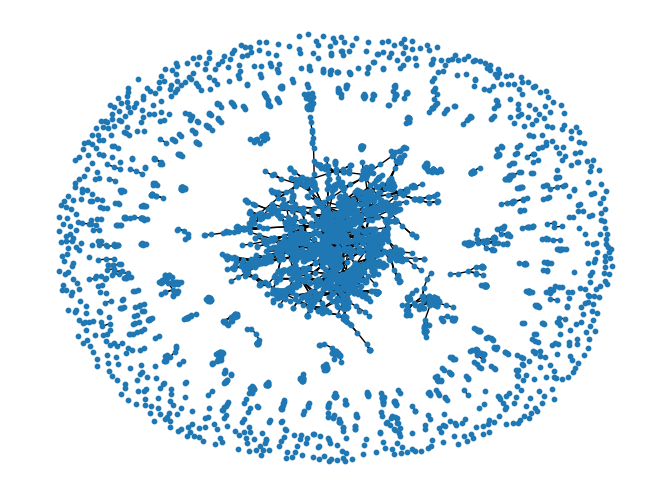

In [35]:

nx.draw(G, node_size=10, with_labels=False)
plt.show()

In [36]:
print(f"Total number of edges in the graph: {G.number_of_edges()}")

print("\nFirst 100 edge weights:")
for i, (u, v, attr) in enumerate(G.edges(data=True)):
    if i < 100:  # Limit to the first 100 edges
        print(f"Edge ({u}, {v}) - Weight: {attr['weight']:.4f}")
    else:
        break

Total number of edges in the graph: 32730

First 100 edge weights:
Edge (1, 4597) - Weight: 0.5154
Edge (3, 4) - Weight: 0.9272
Edge (3, 21) - Weight: 0.6975
Edge (3, 22) - Weight: 0.6918
Edge (3, 38) - Weight: 0.5774
Edge (3, 2518) - Weight: 0.5962
Edge (3, 2519) - Weight: 0.5913
Edge (3, 2521) - Weight: 0.5987
Edge (4, 21) - Weight: 0.6852
Edge (4, 22) - Weight: 0.6732
Edge (4, 38) - Weight: 0.5750
Edge (4, 2518) - Weight: 0.6147
Edge (4, 2519) - Weight: 0.6057
Edge (4, 2521) - Weight: 0.6175
Edge (7, 8) - Weight: 0.6621
Edge (7, 48) - Weight: 0.6971
Edge (7, 550) - Weight: 0.5214
Edge (7, 594) - Weight: 0.5214
Edge (8, 48) - Weight: 0.6832
Edge (9, 11) - Weight: 0.9984
Edge (10, 13) - Weight: 0.5486
Edge (10, 35) - Weight: 0.5251
Edge (10, 49) - Weight: 0.5685
Edge (10, 2072) - Weight: 0.6757
Edge (10, 2073) - Weight: 0.6051
Edge (10, 2507) - Weight: 0.5472
Edge (10, 2508) - Weight: 0.5692
Edge (10, 2510) - Weight: 0.5710
Edge (10, 2524) - Weight: 0.6027
Edge (10, 2526) - Weight: 0.

In [8]:
num_connected_components = nx.number_connected_components(G)
print(f"Total number of connected components: {num_connected_components}")

nodes_with_edges = len([node for node in G.nodes if G.degree(node) > 0])
percent_nodes_with_edges = (nodes_with_edges / G.number_of_nodes()) * 100
print(f"Percentage of nodes with at least one edge: {percent_nodes_with_edges:.2f}%")

Total number of connected components: 880
Percentage of nodes with at least one edge: 88.32%


In [15]:
import scipy.sparse 
for node, attr in G.nodes(data=True):
    if 'feature' in attr and isinstance(attr['feature'], (scipy.sparse.spmatrix, np.ndarray)):
        attr['feature'] = attr['feature'].toarray().tolist() if isinstance(attr['feature'], scipy.sparse.spmatrix) else attr['feature'].tolist()


for u, v, attr in G.edges(data=True):
    if 'weight' in attr and isinstance(attr['weight'], (scipy.sparse.spmatrix, np.ndarray)):
        attr['weight'] = attr['weight'].tolist()




In [19]:
import networkx as nx

G_original = G.copy()

G_modified = G_original.copy()

for node in G_modified.nodes(data=True):
    if 'feature' in node[1]:  
        del node[1]['feature']

for u, v, attr in G_modified.edges(data=True):
    if 'weight' in attr:  
        del attr['weight']


In [20]:
output_file = "graph_export.gexf"
nx.write_gexf(G_modified, output_file)

print(f"Modified graph exported to {output_file}")

Modified graph exported to graph_export.gexf


In [21]:
# Convert the networkx graph to PyTorch Geometric format
data = from_networkx(G)

# Ensure that node features and labels are properly assigned
data.x = torch.tensor(features.todense(), dtype=torch.float)
data.y = torch.tensor(labels, dtype=torch.long)

# Set up train and test masks
data.train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.train_mask[:len(train_texts)] = 1

data.test_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.test_mask[len(train_texts):] = 1


In [22]:
# Define the GCN model
class GCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)
        return torch.log_softmax(x, dim=1)

# Model parameters
input_dim = data.num_features
hidden_dim = 64
output_dim = len(label_encoder.classes_)

# Initialize model
model = GCN(input_dim, hidden_dim, output_dim)



Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Predicted Label: 0
Index: 2520, True Label: 0, Pred

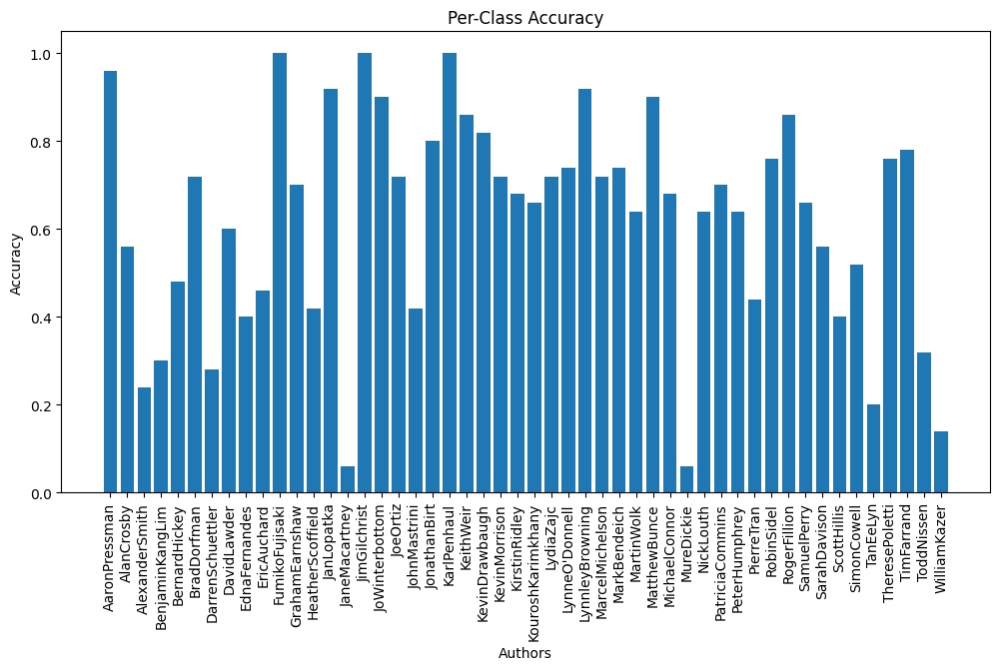

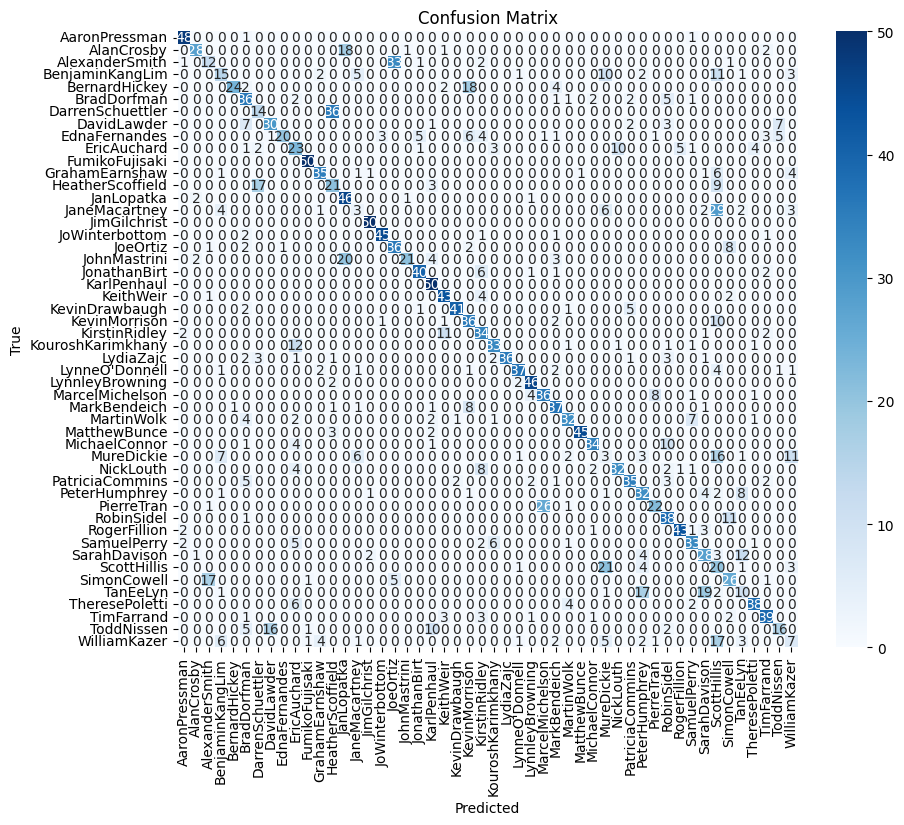

Epoch: 0, Loss: 0.5190, Test Accuracy: 0.6236

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Predi

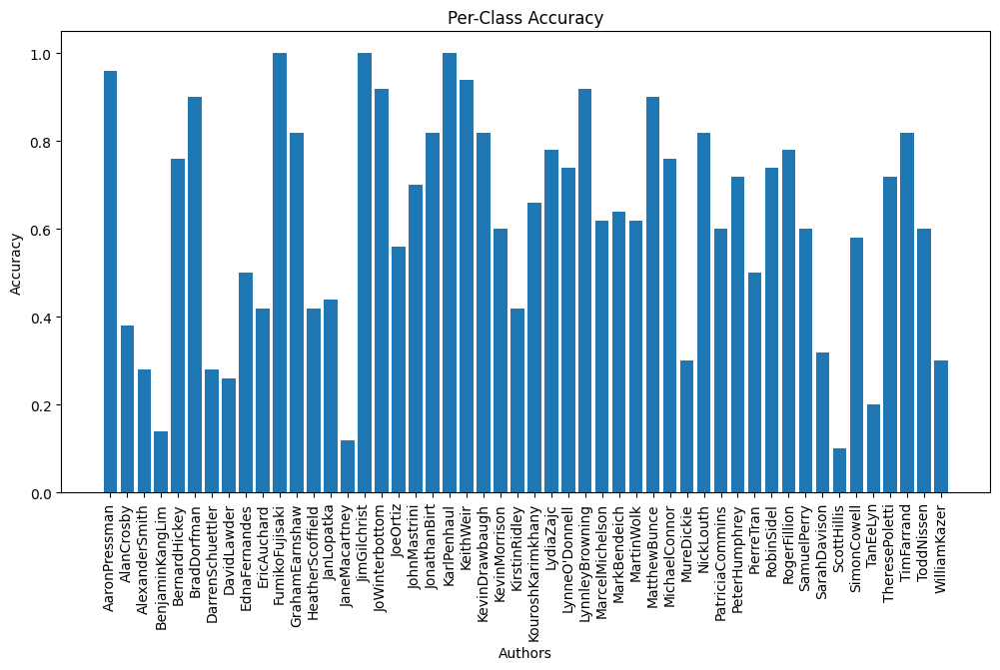

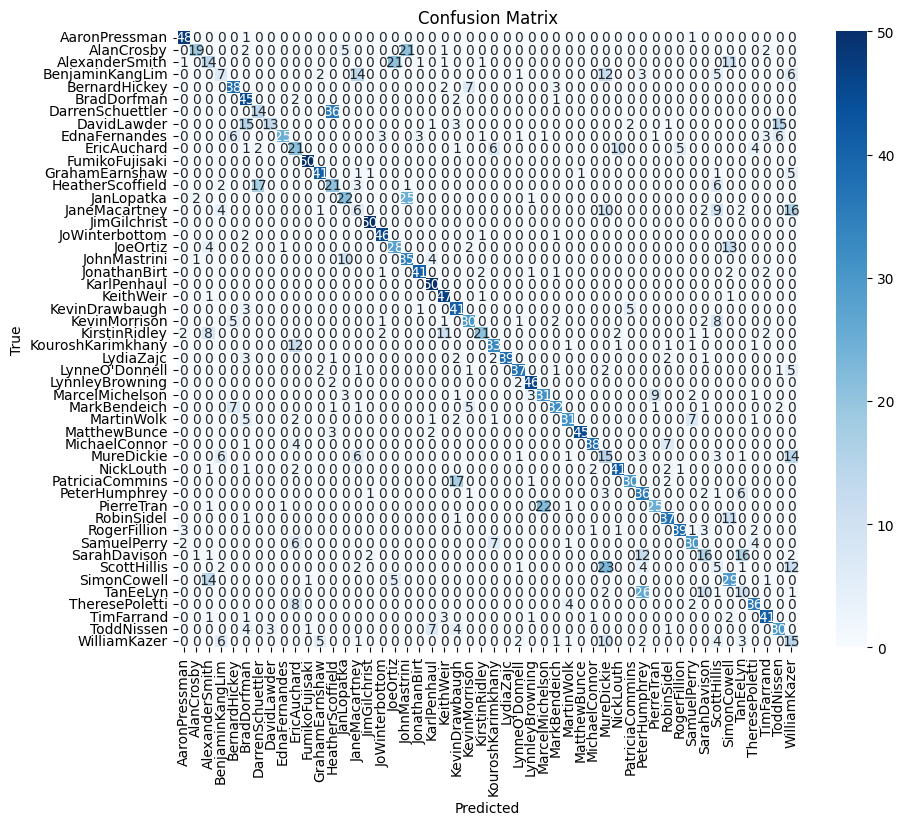

Epoch: 10, Loss: 0.5251, Test Accuracy: 0.6160

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

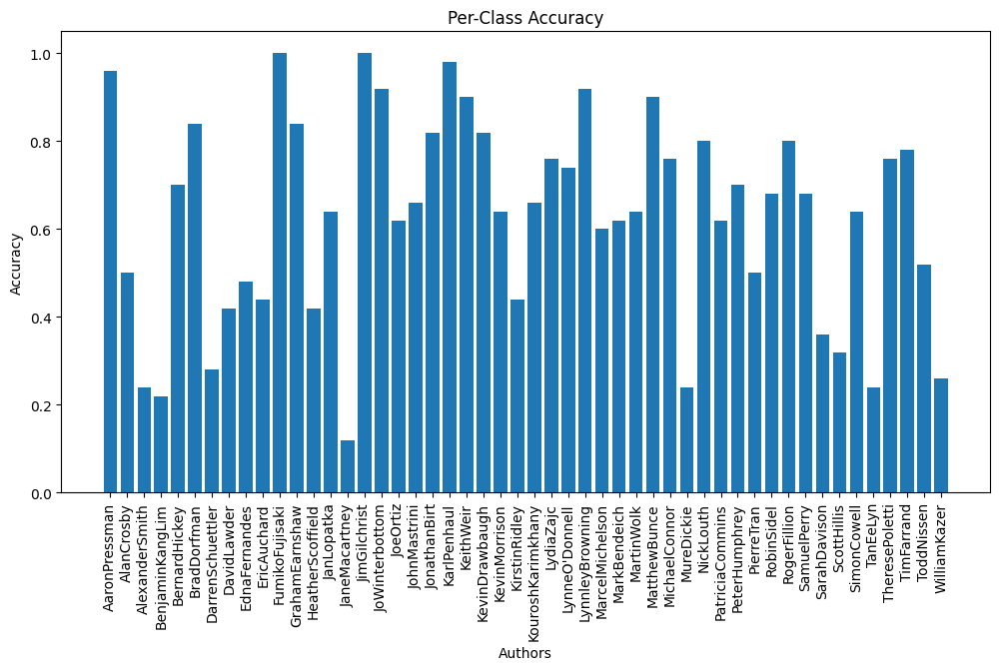

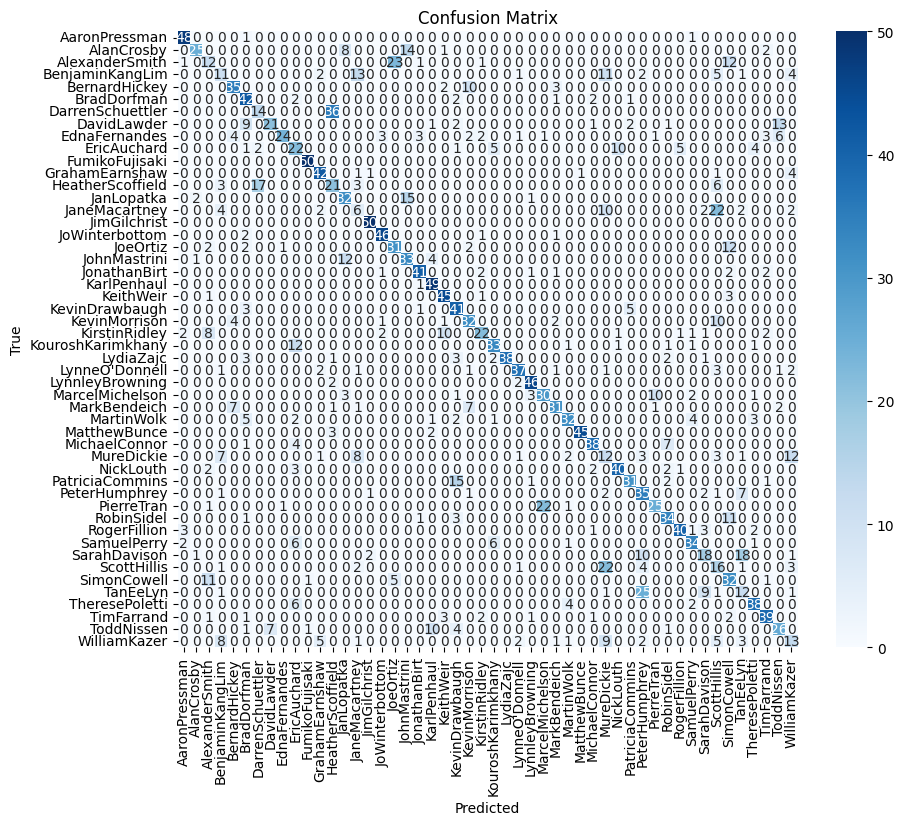

Epoch: 20, Loss: 0.5338, Test Accuracy: 0.6280

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

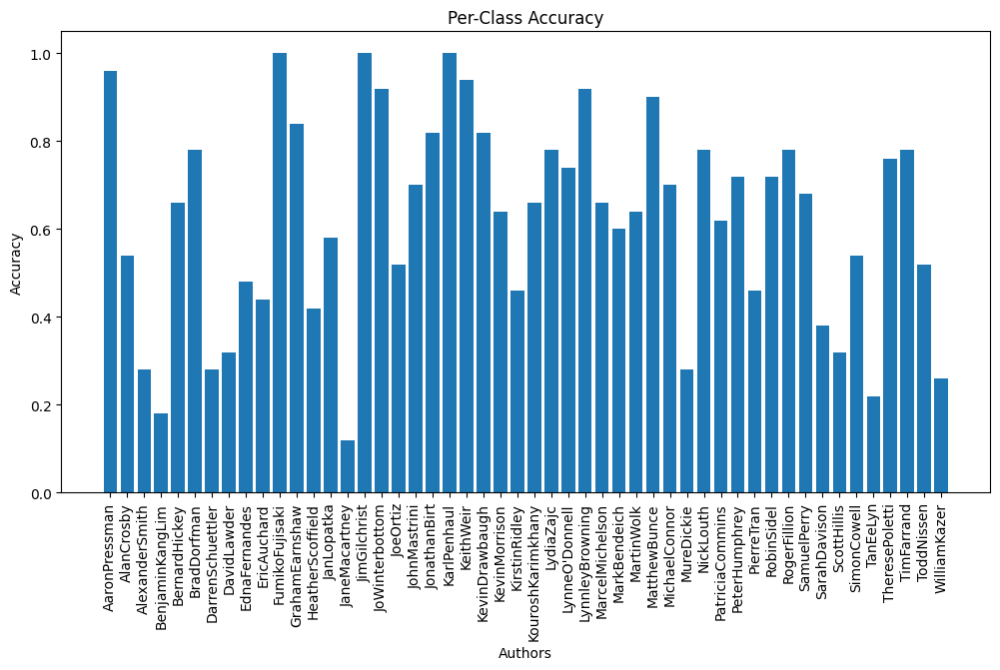

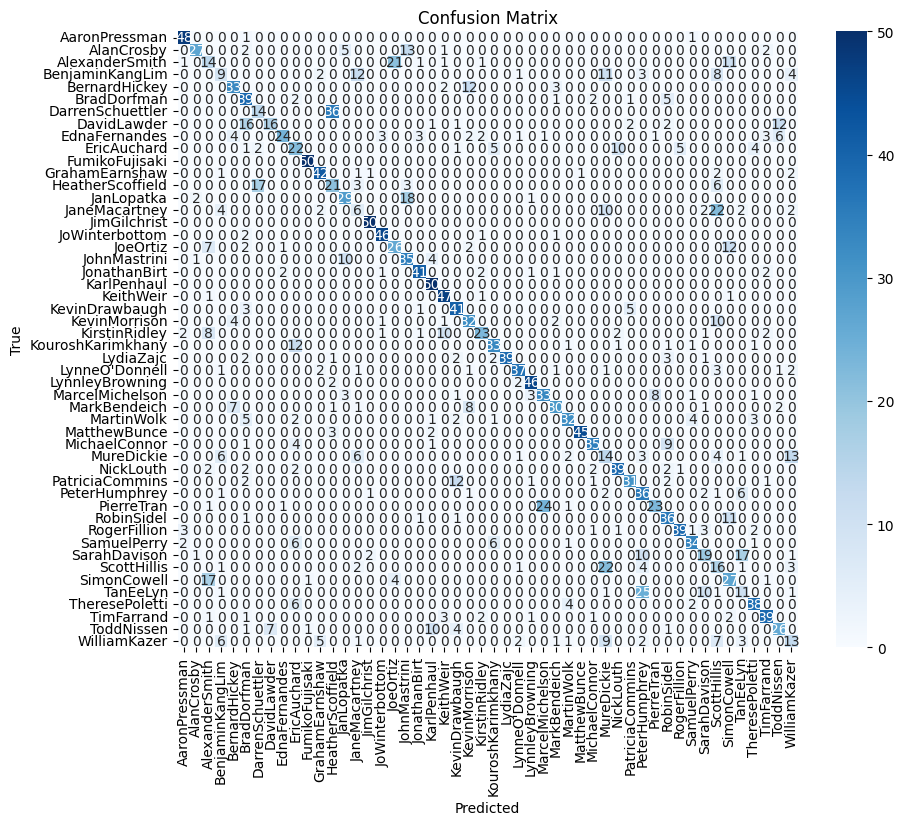

Epoch: 30, Loss: 0.5241, Test Accuracy: 0.6224

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

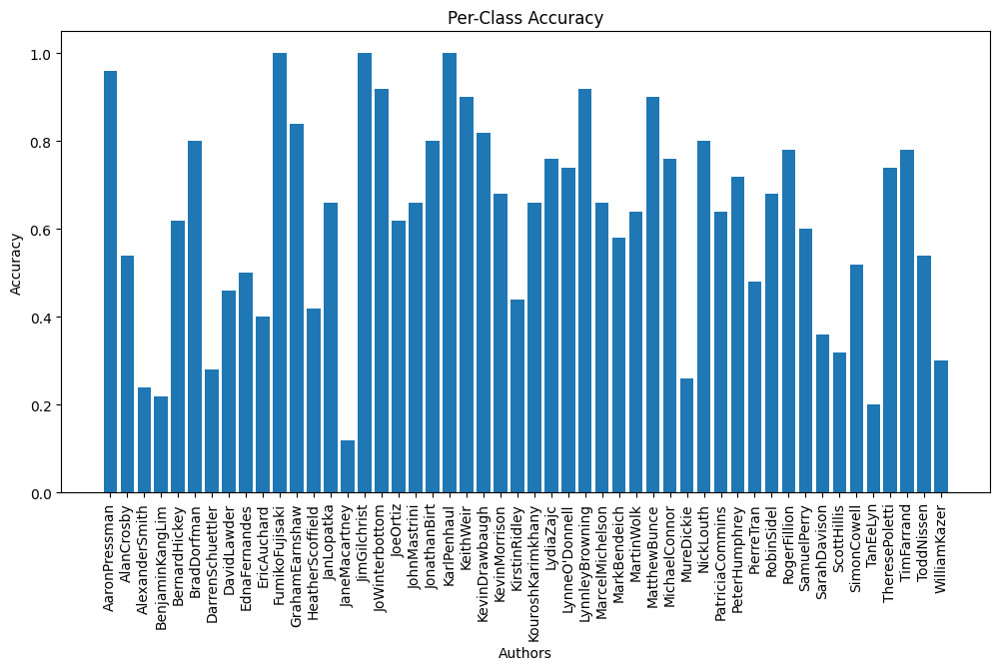

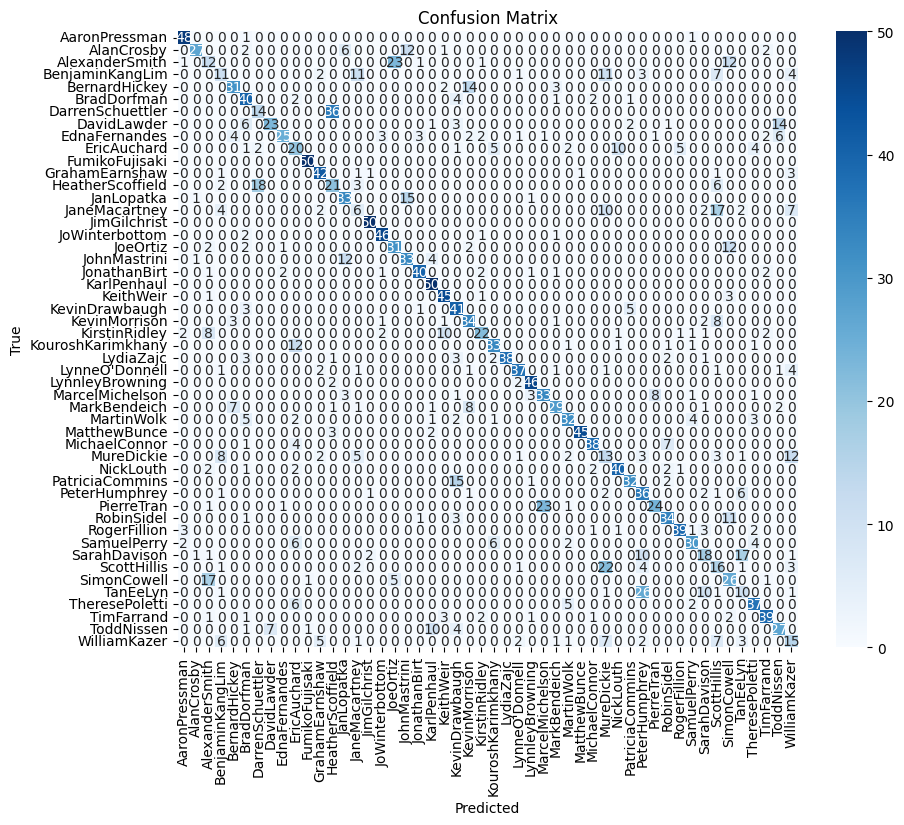

Epoch: 40, Loss: 0.5284, Test Accuracy: 0.6248

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

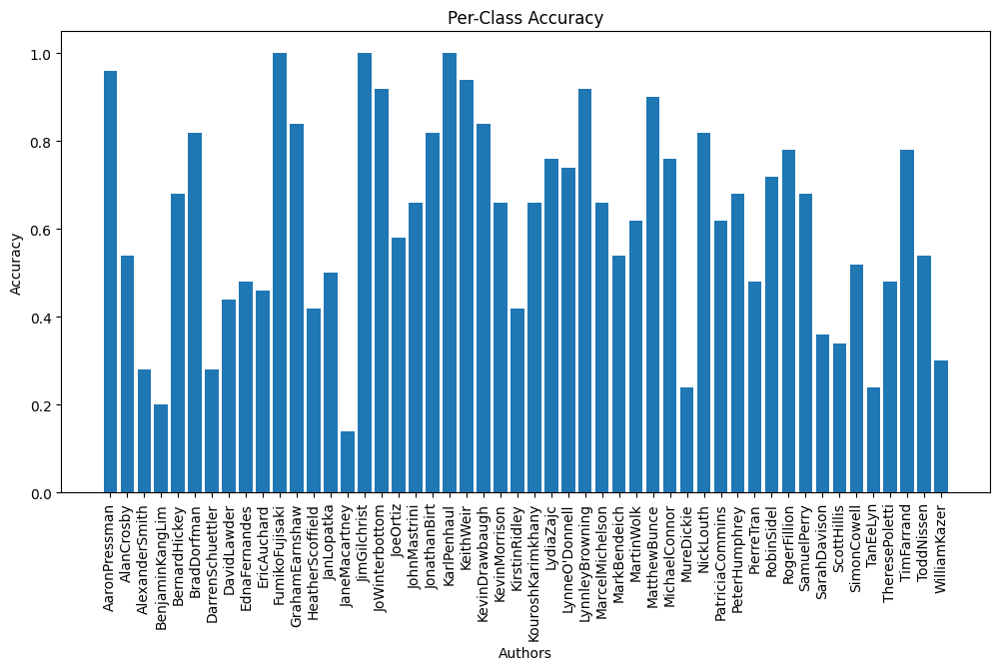

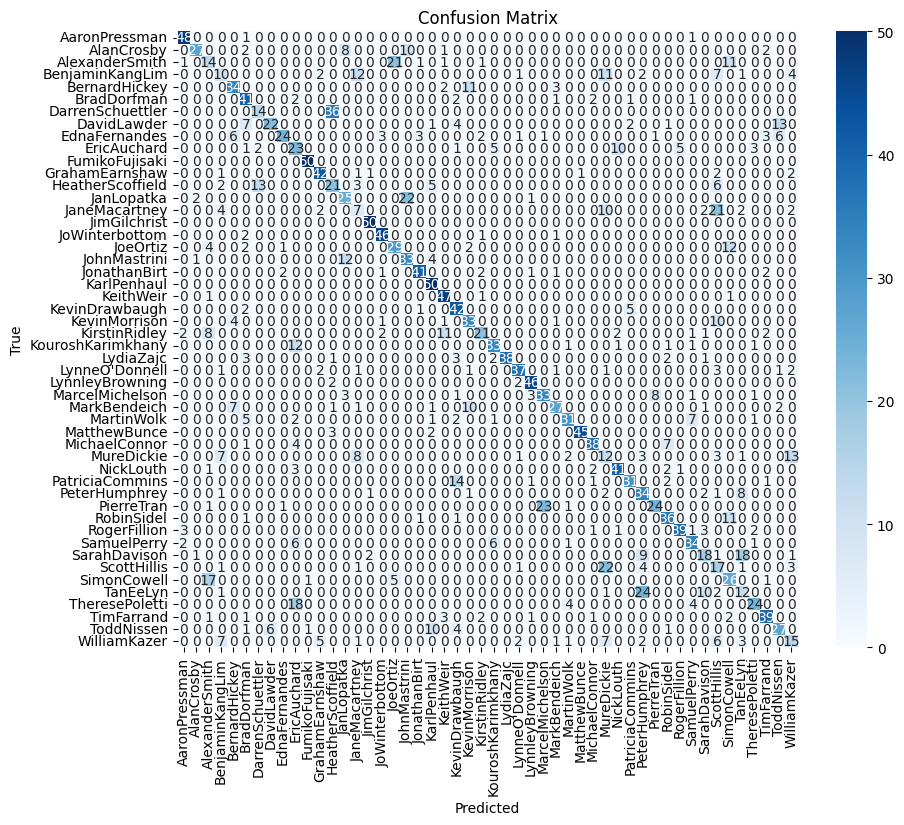

Epoch: 50, Loss: 0.5335, Test Accuracy: 0.6204

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

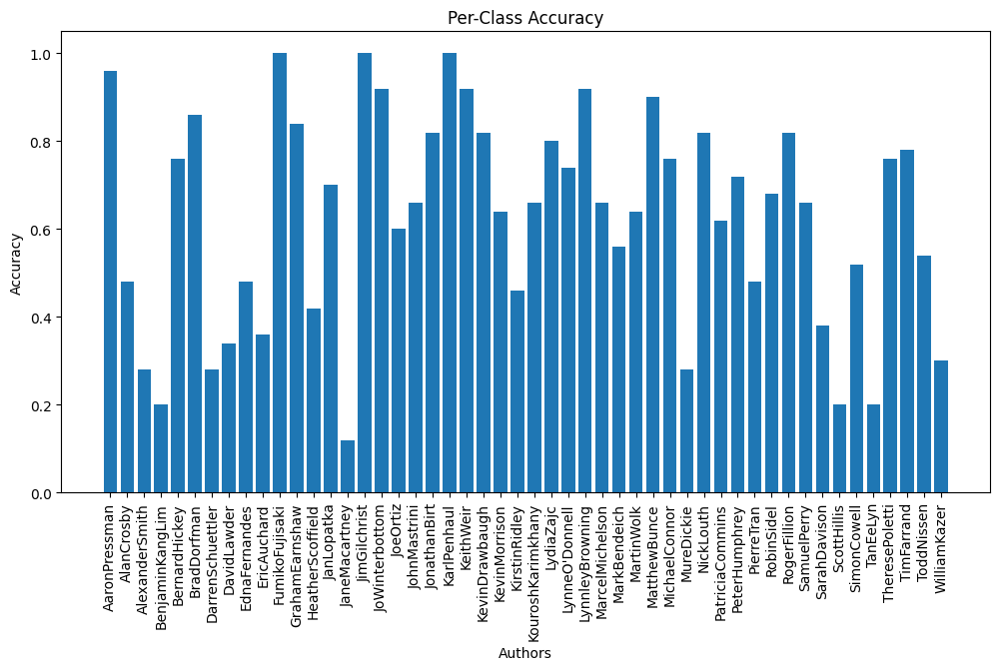

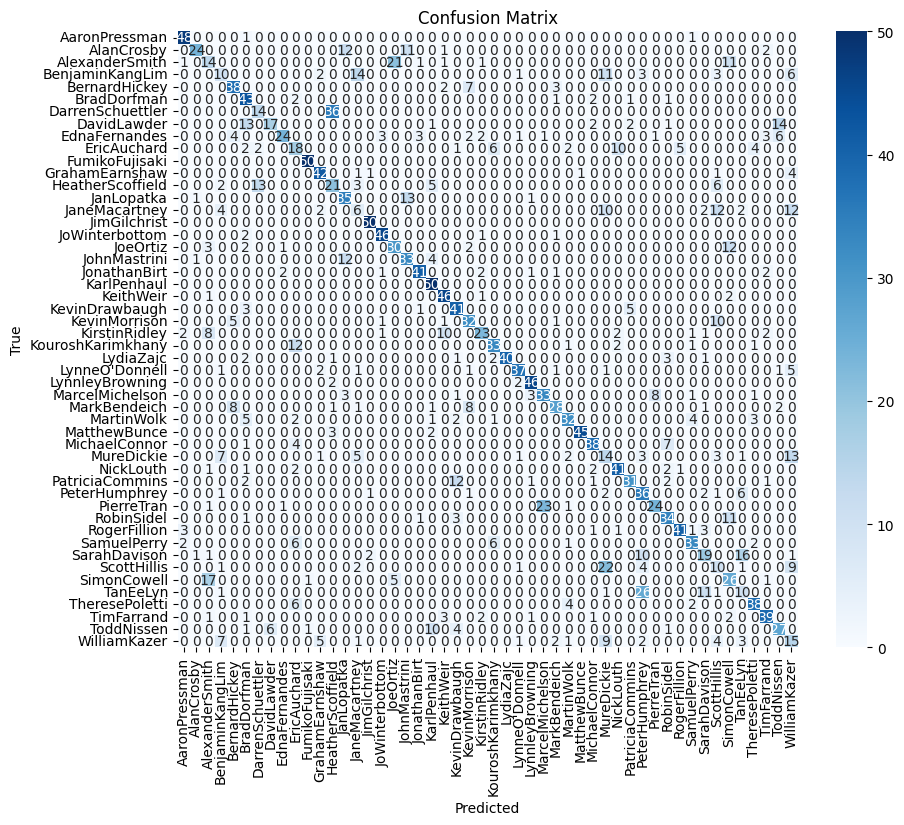

Epoch: 60, Loss: 0.5256, Test Accuracy: 0.6264

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

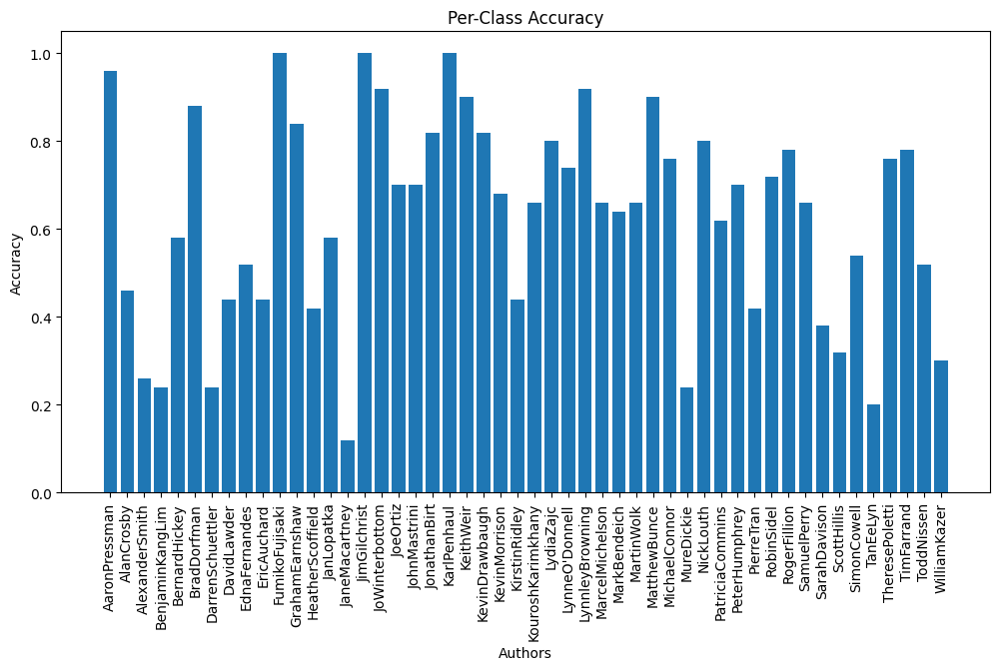

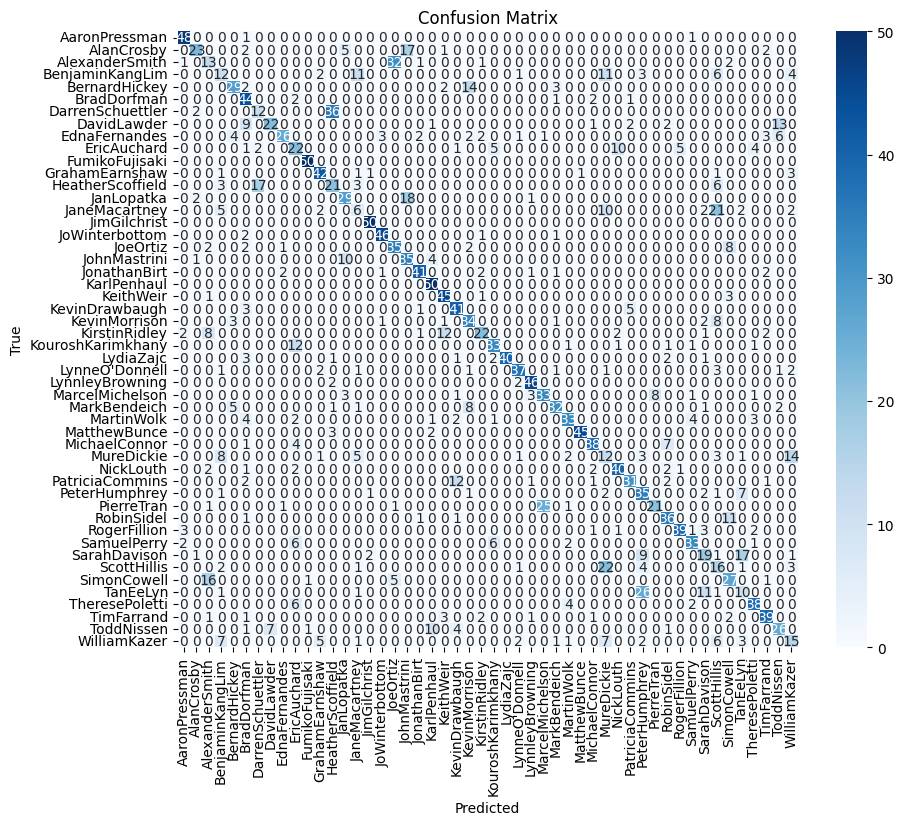

Epoch: 70, Loss: 0.5258, Test Accuracy: 0.6288

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

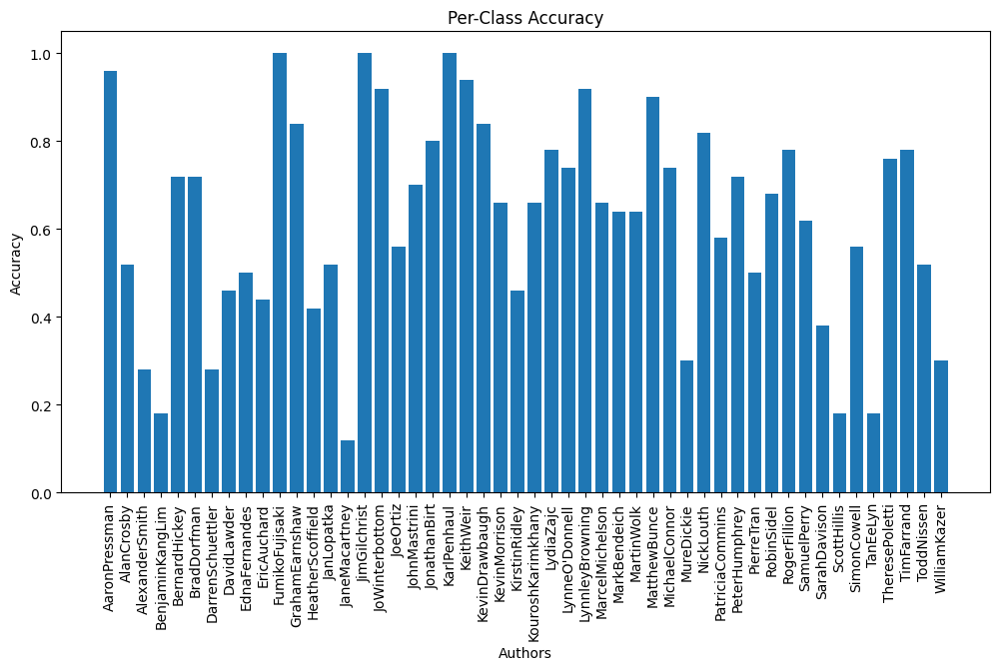

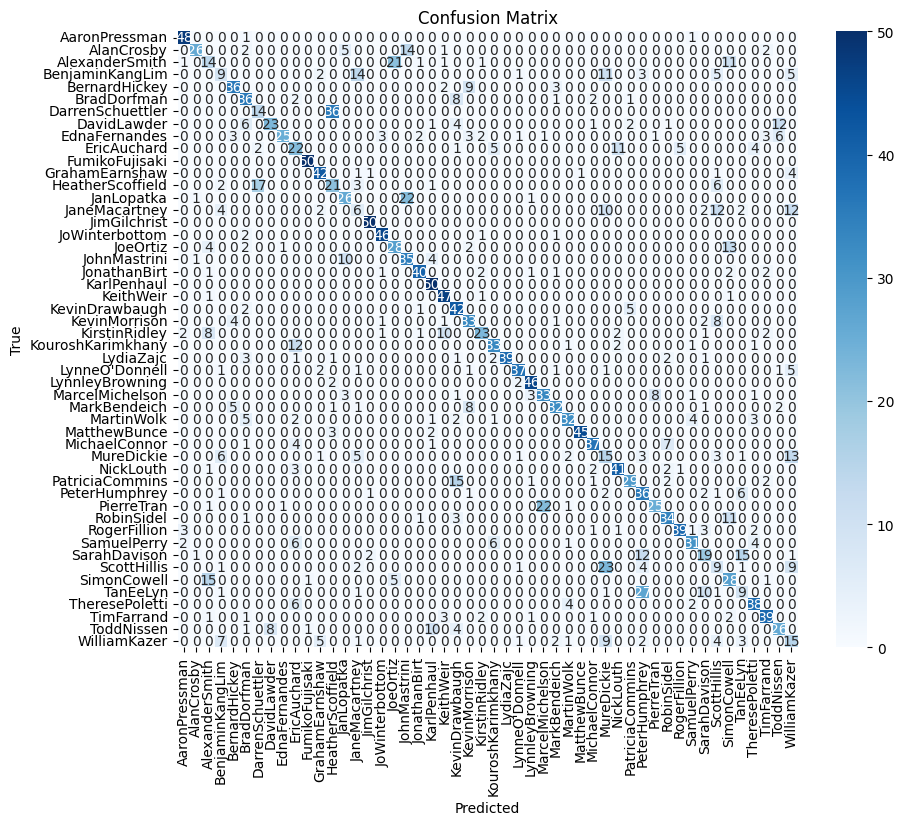

Epoch: 80, Loss: 0.5228, Test Accuracy: 0.6236

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

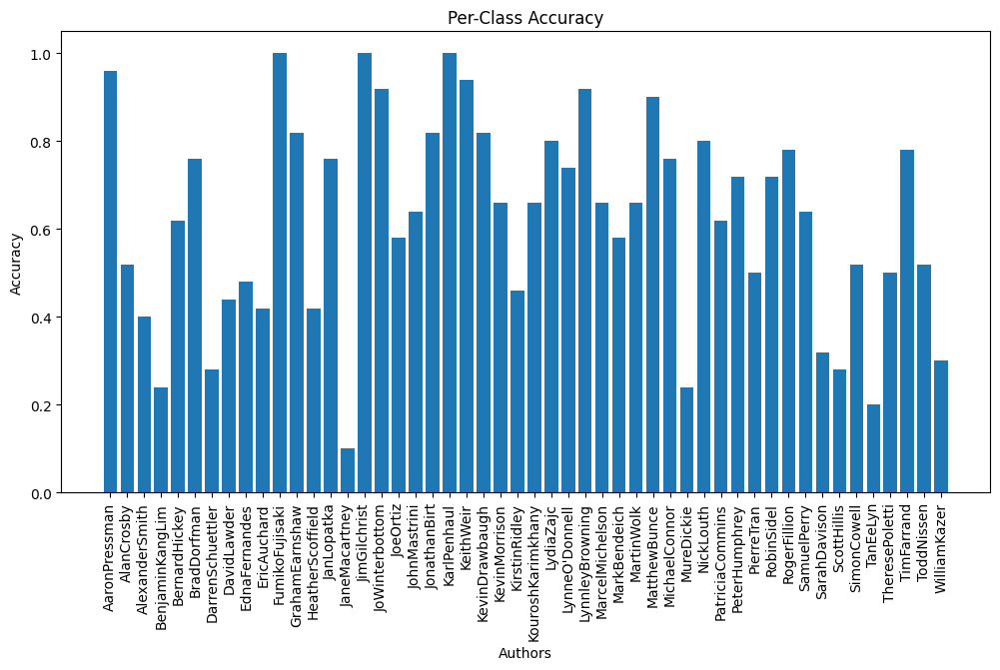

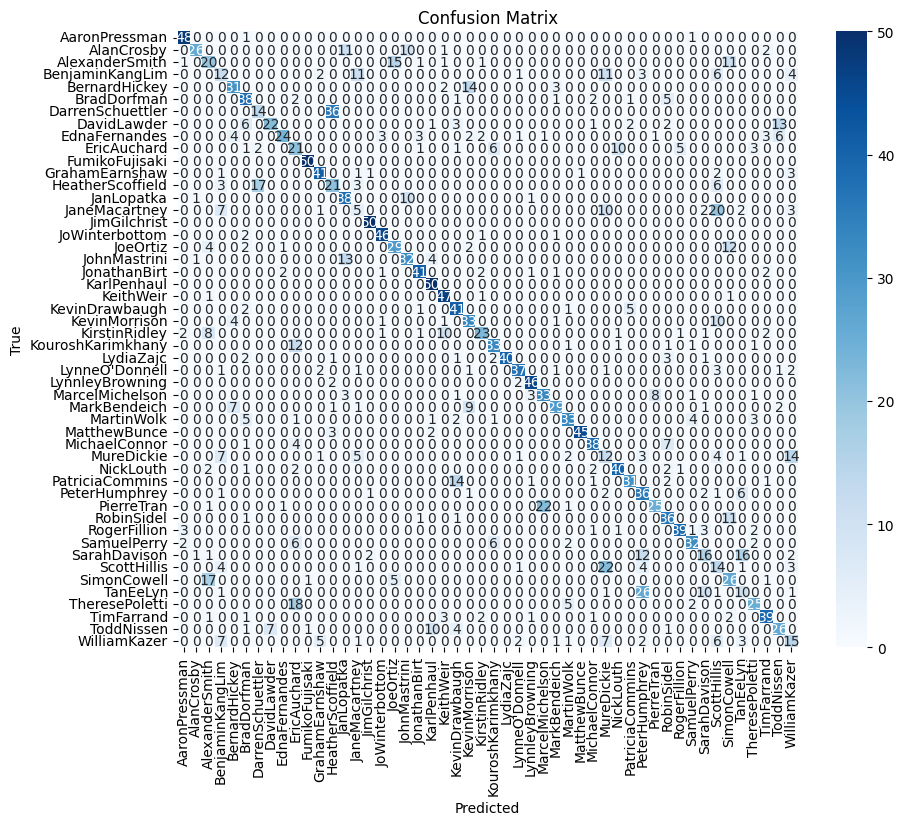

Epoch: 90, Loss: 0.5319, Test Accuracy: 0.6236

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pred

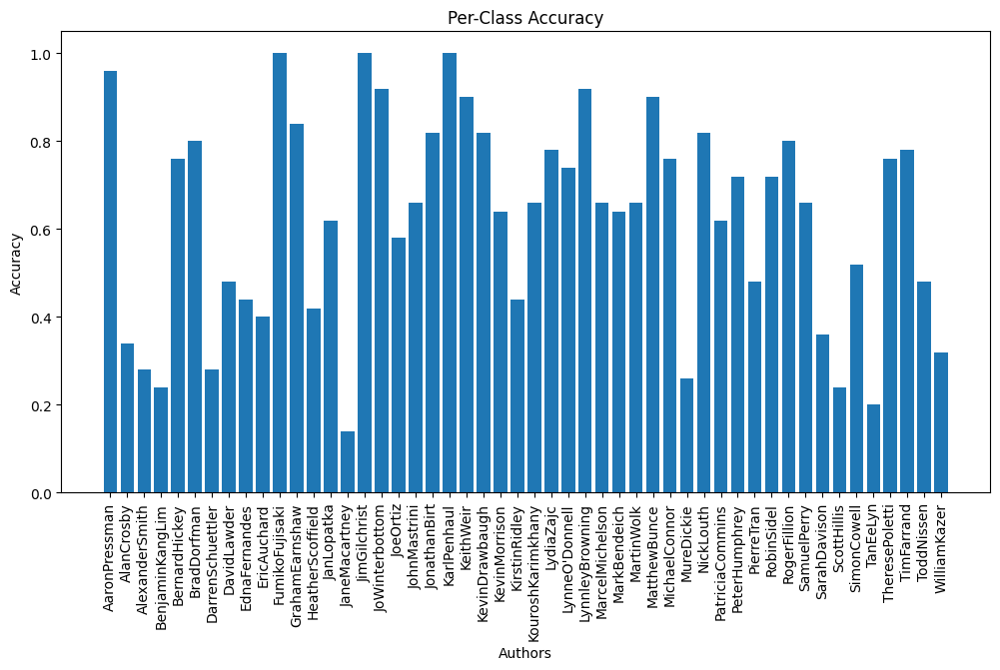

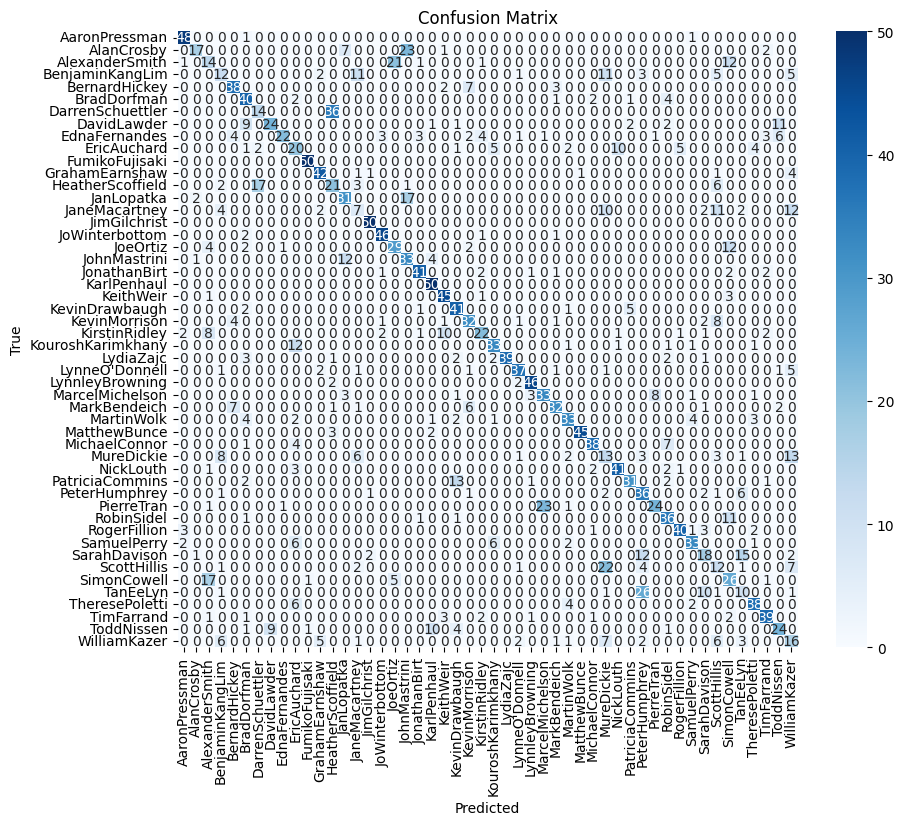

Epoch: 100, Loss: 0.5253, Test Accuracy: 0.6248

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

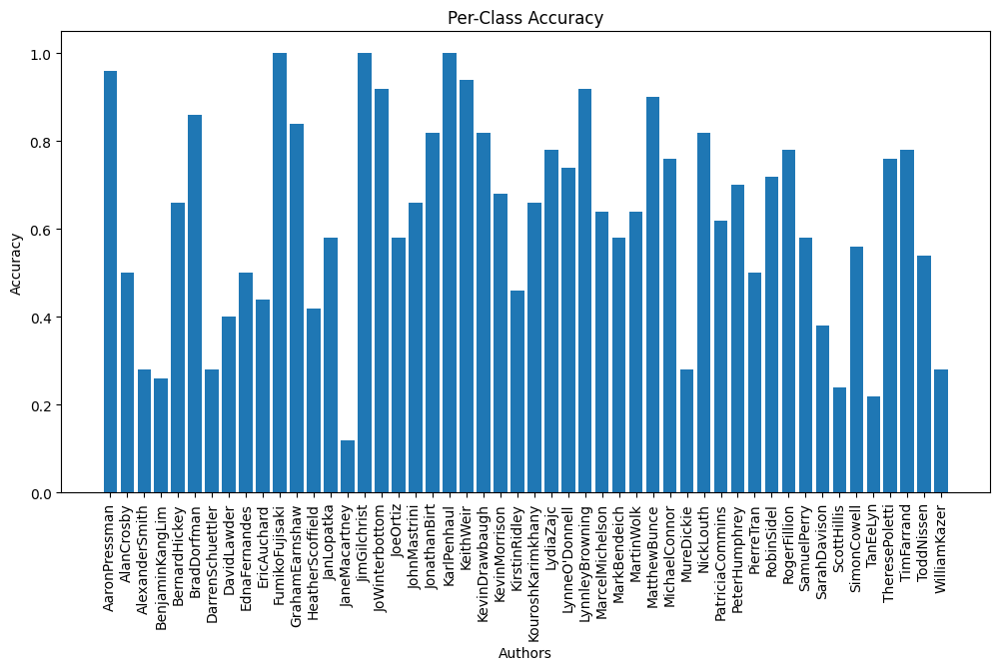

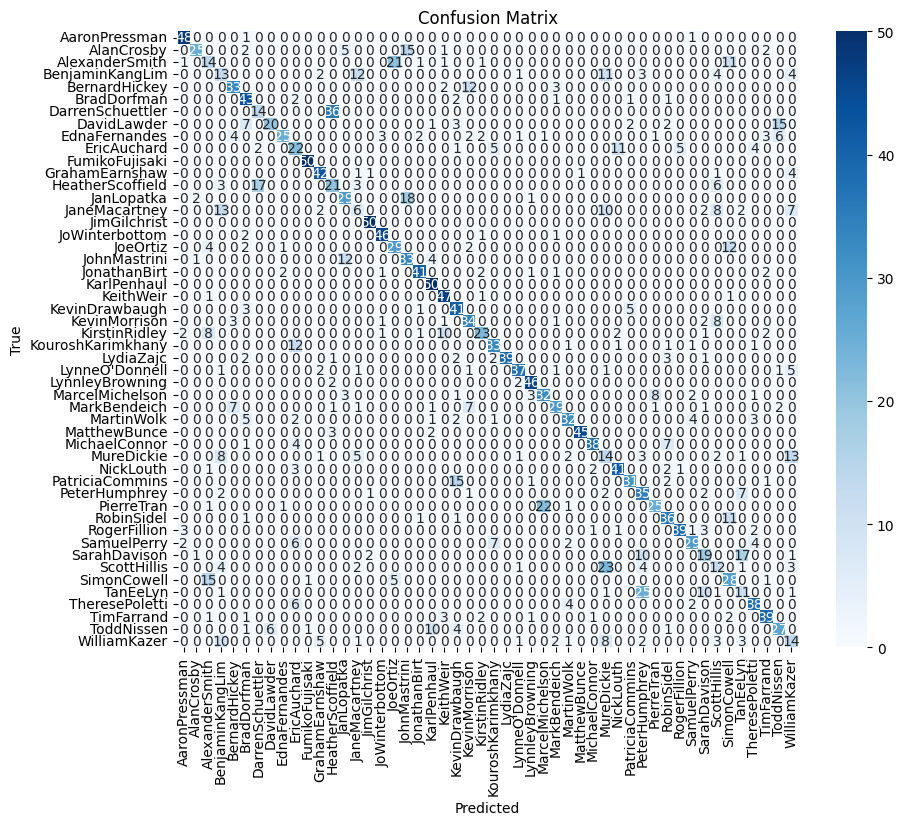

Epoch: 110, Loss: 0.5236, Test Accuracy: 0.6272

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

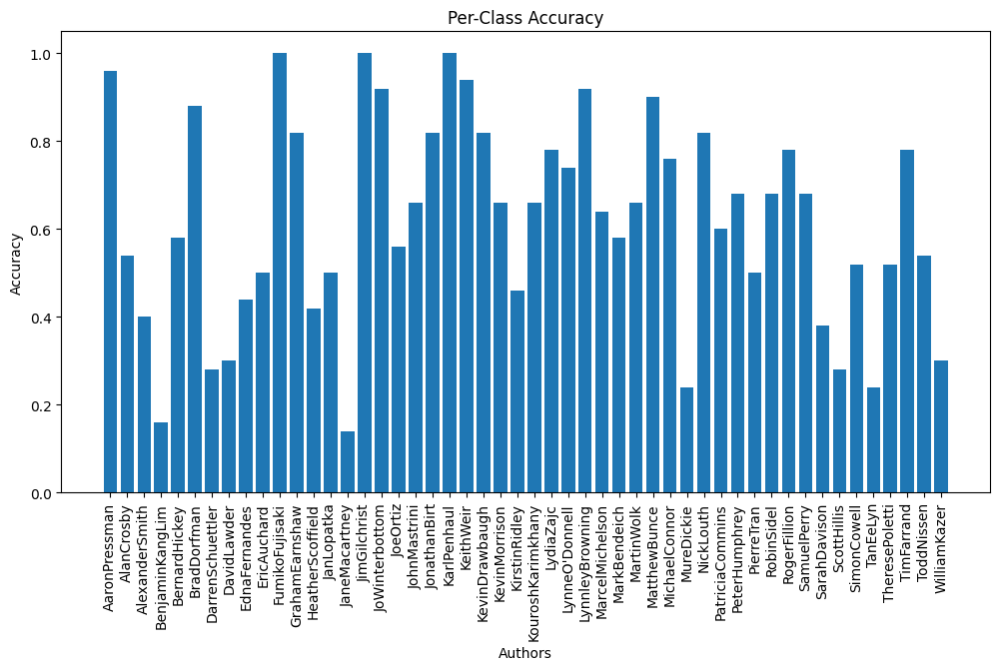

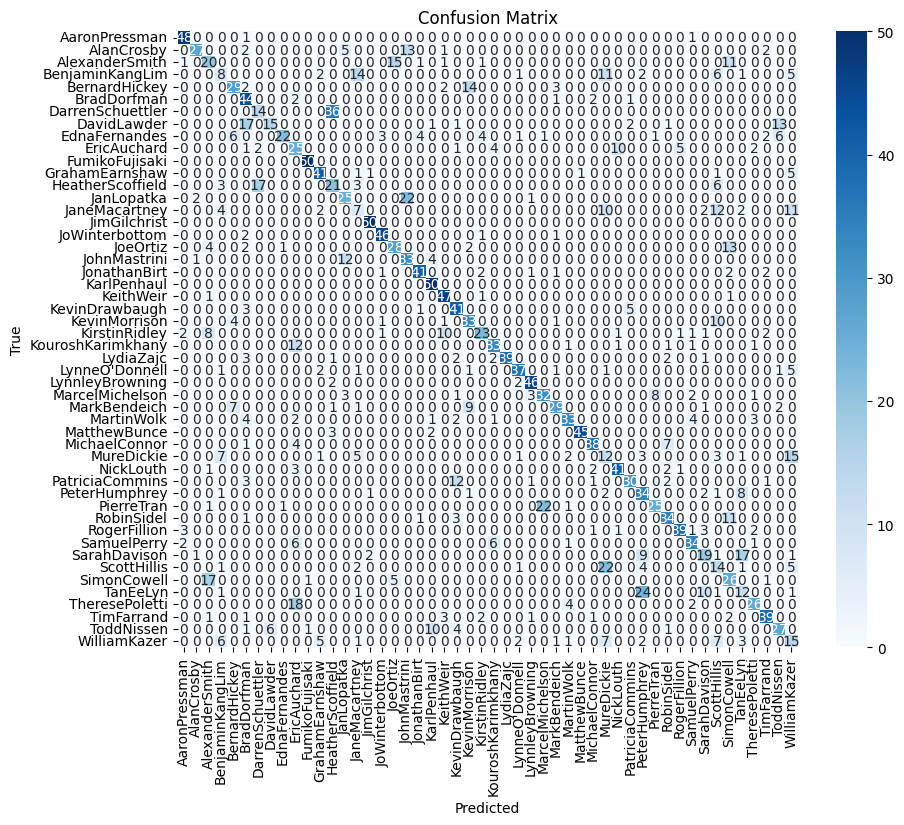

Epoch: 120, Loss: 0.5222, Test Accuracy: 0.6188

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

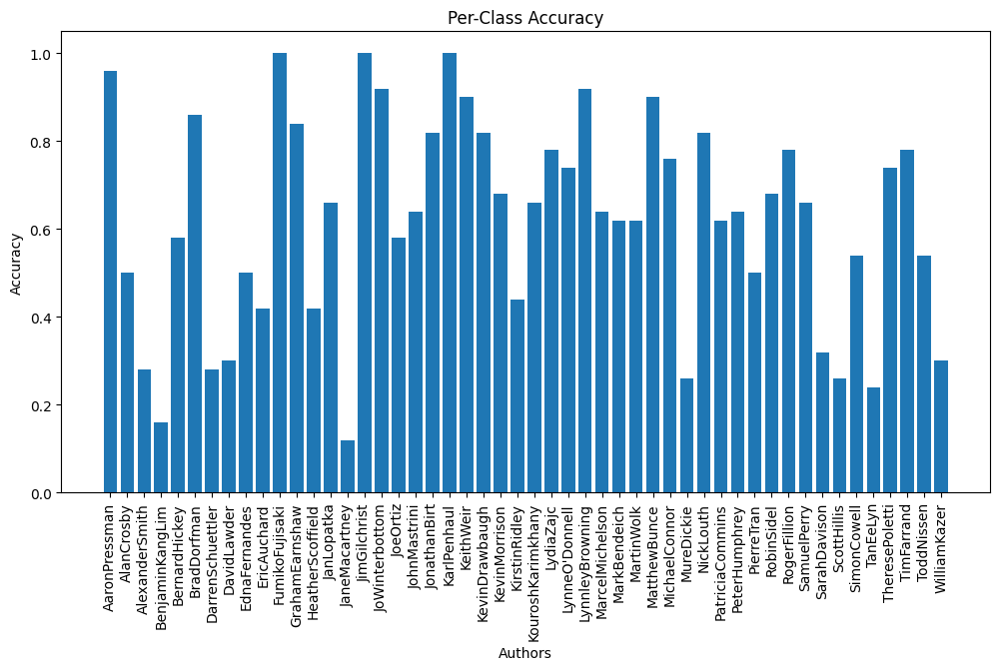

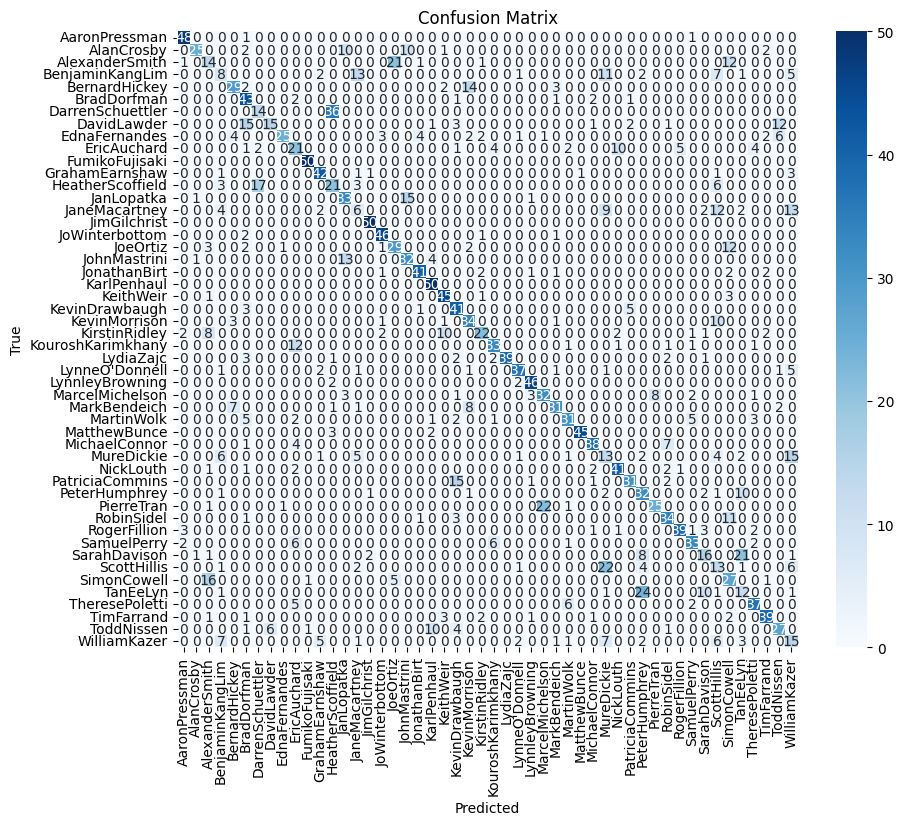

Epoch: 130, Loss: 0.5234, Test Accuracy: 0.6200

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

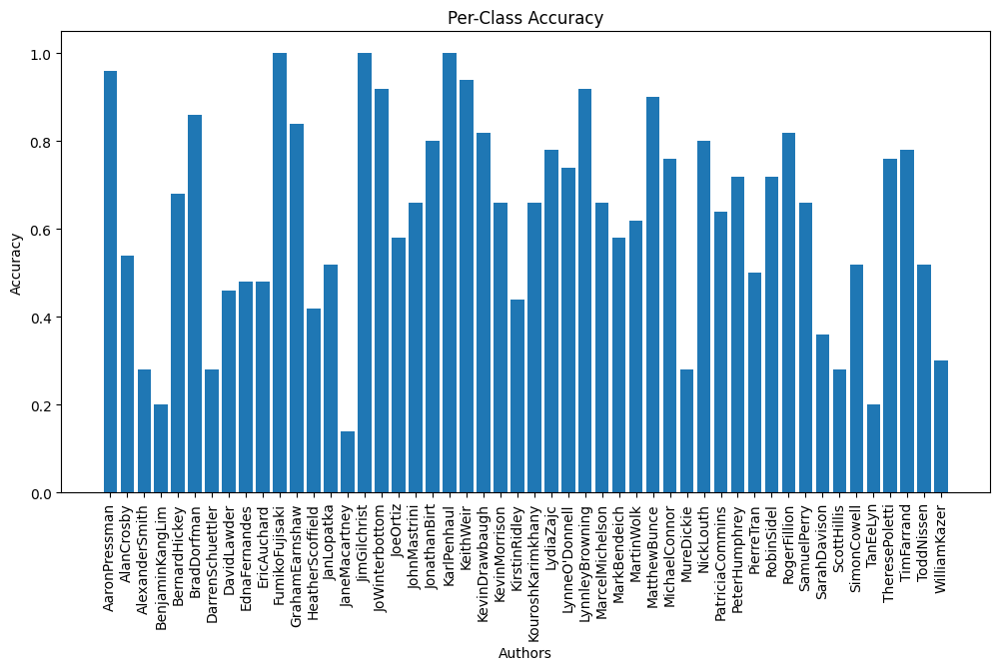

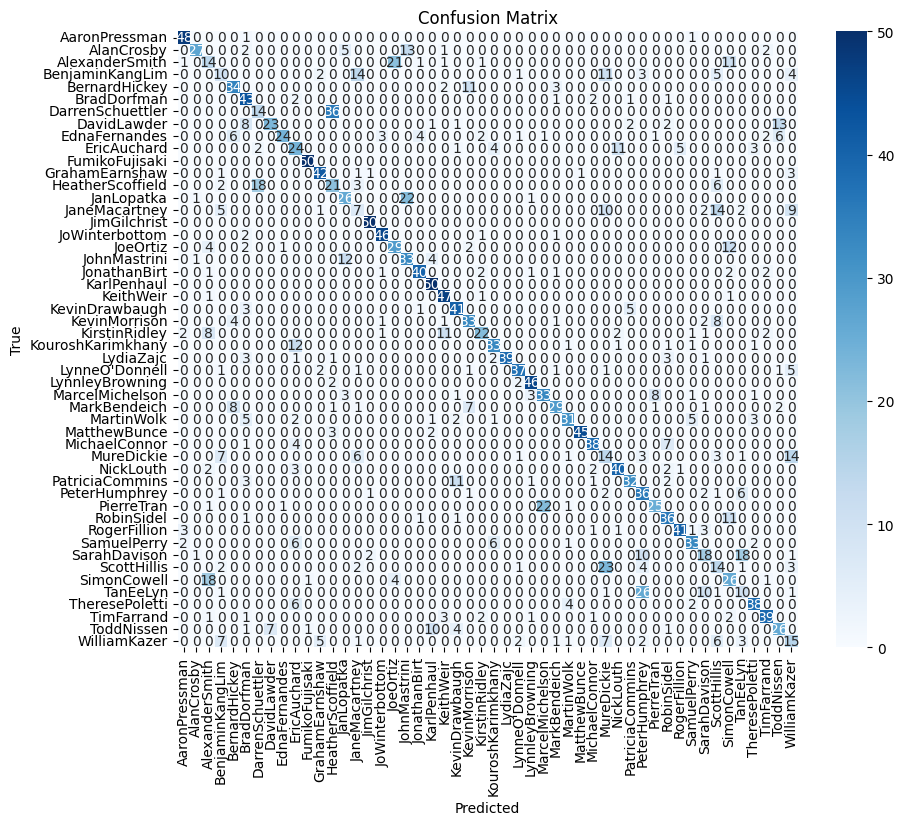

Epoch: 140, Loss: 0.5288, Test Accuracy: 0.6288

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

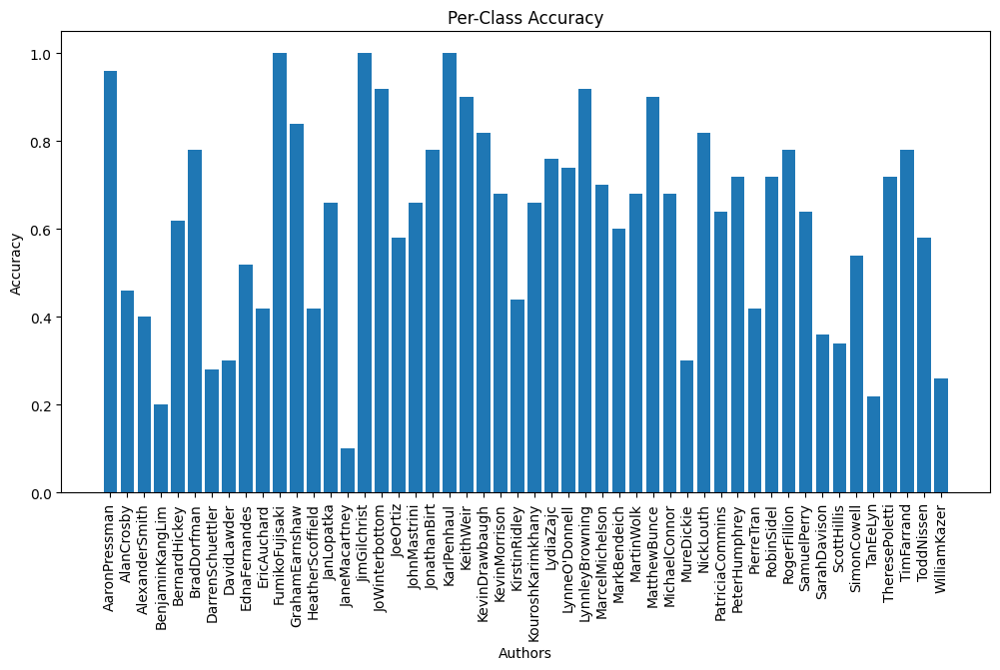

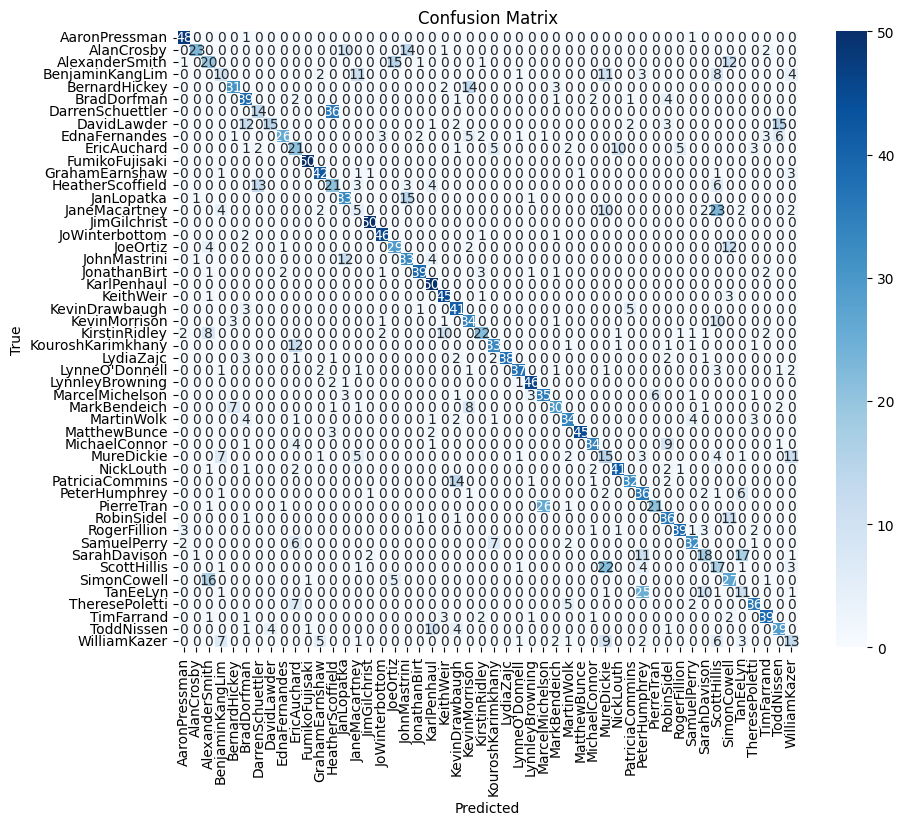

Epoch: 150, Loss: 0.5228, Test Accuracy: 0.6244

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

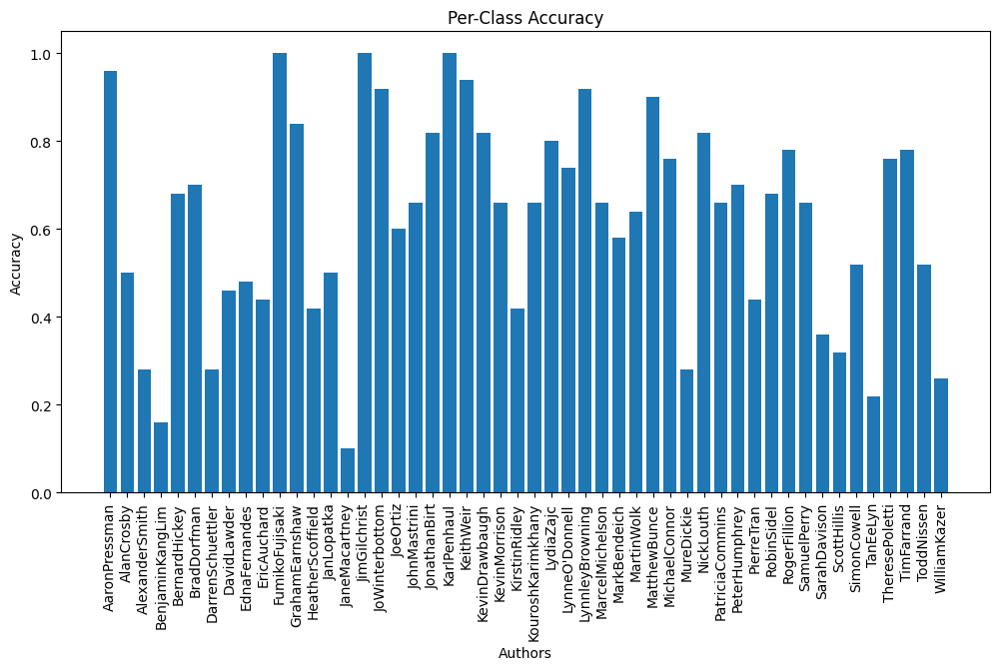

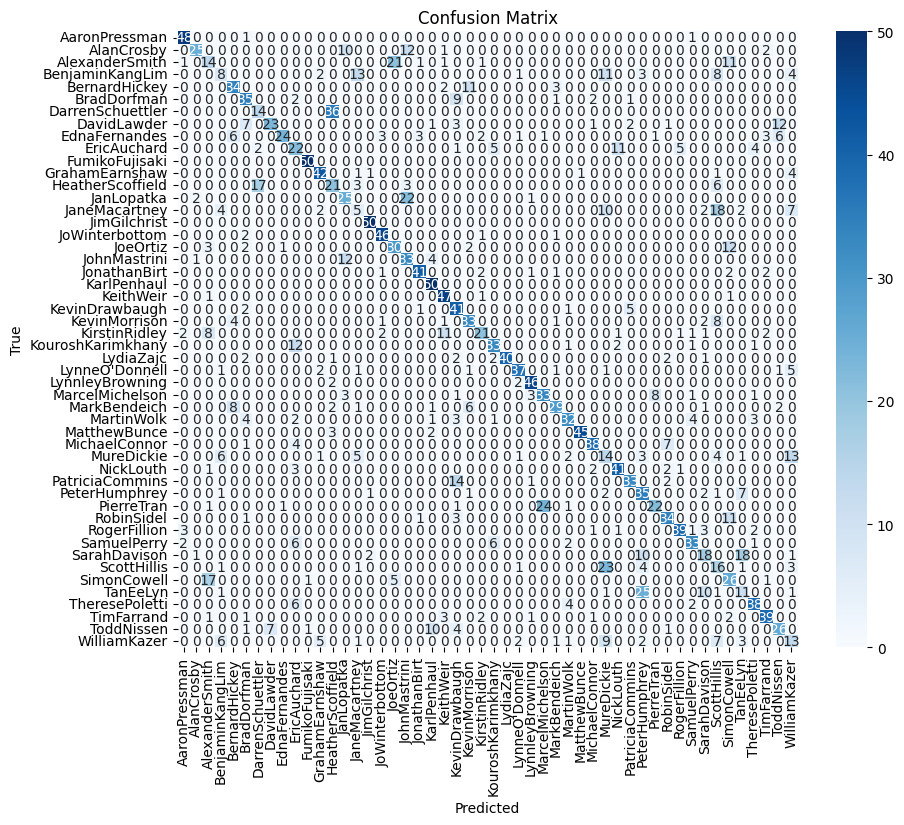

Epoch: 160, Loss: 0.5218, Test Accuracy: 0.6212

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

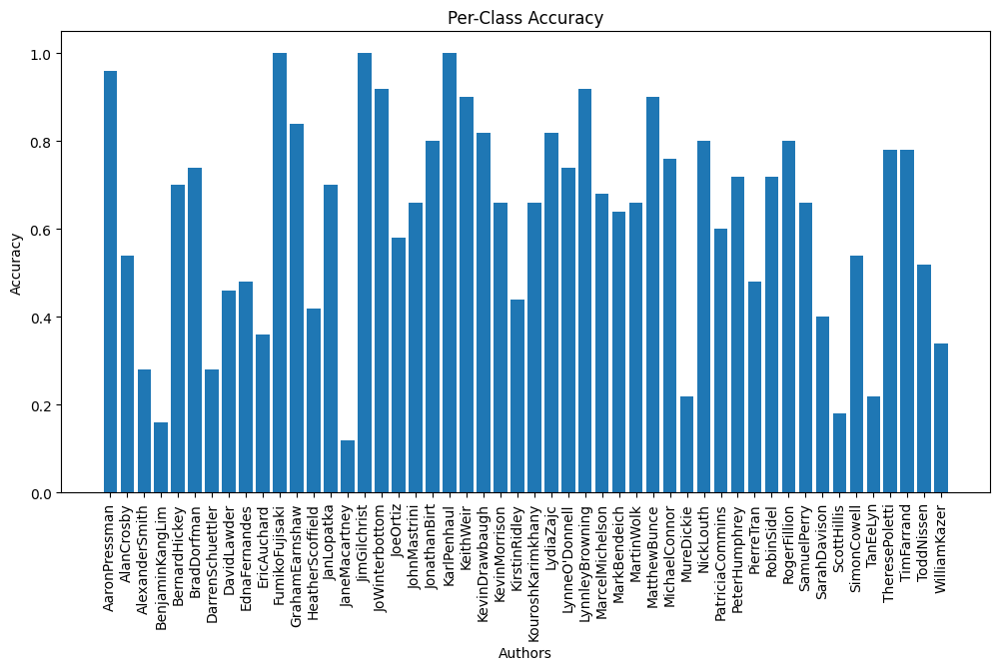

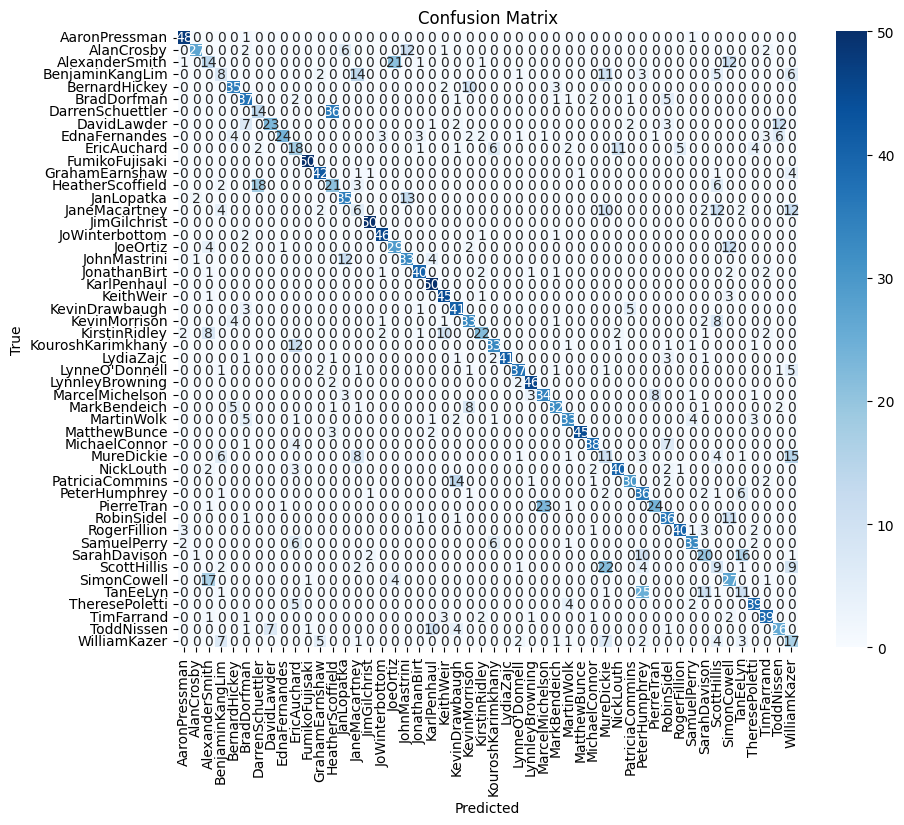

Epoch: 170, Loss: 0.5305, Test Accuracy: 0.6272

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

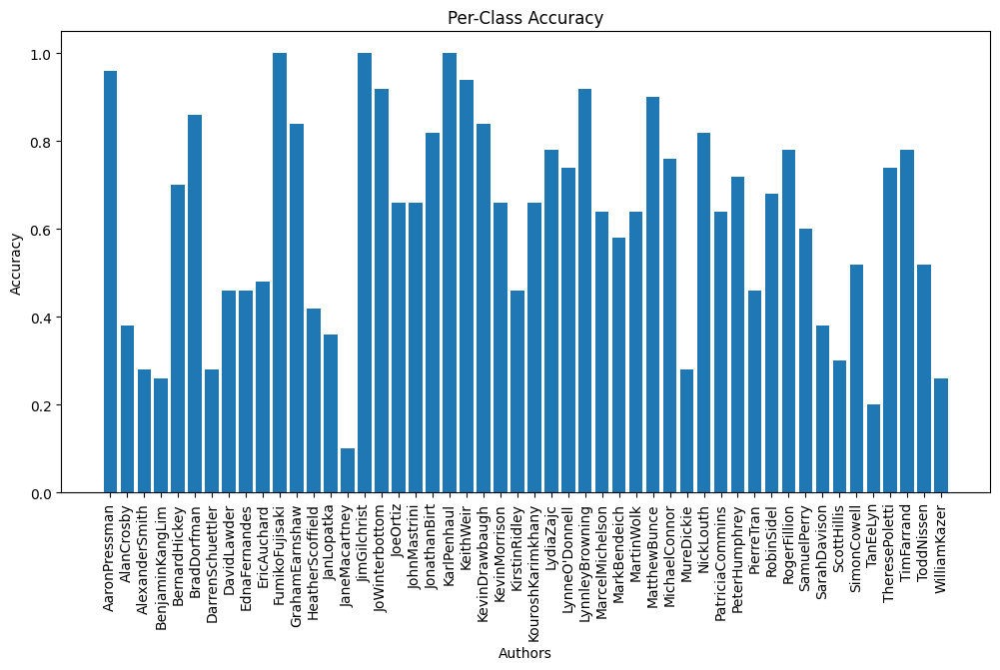

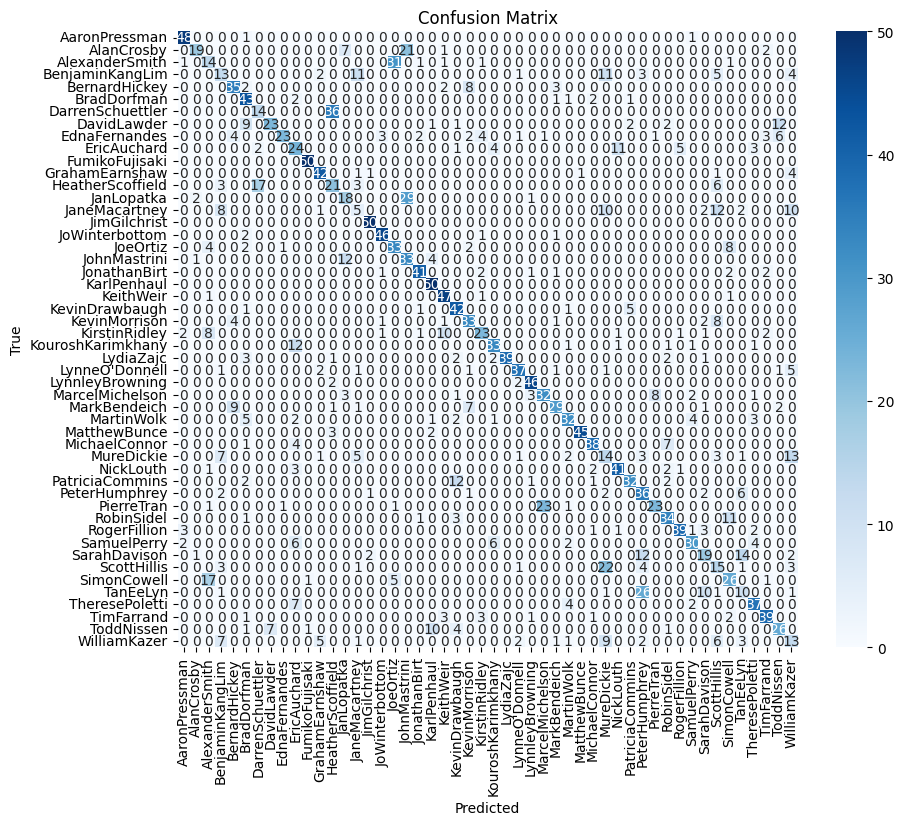

Epoch: 180, Loss: 0.5293, Test Accuracy: 0.6220

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

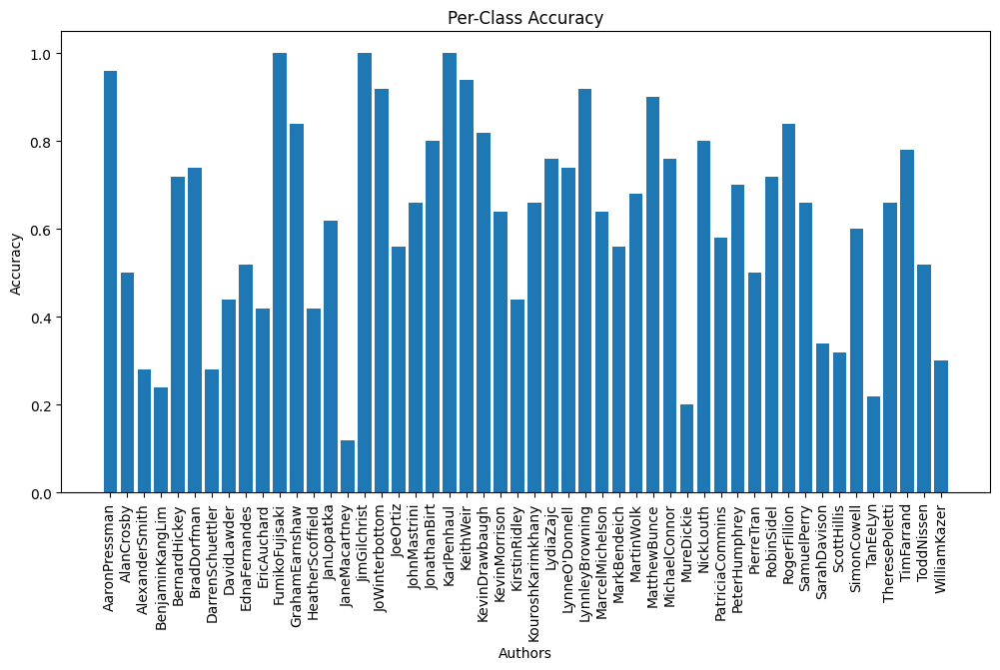

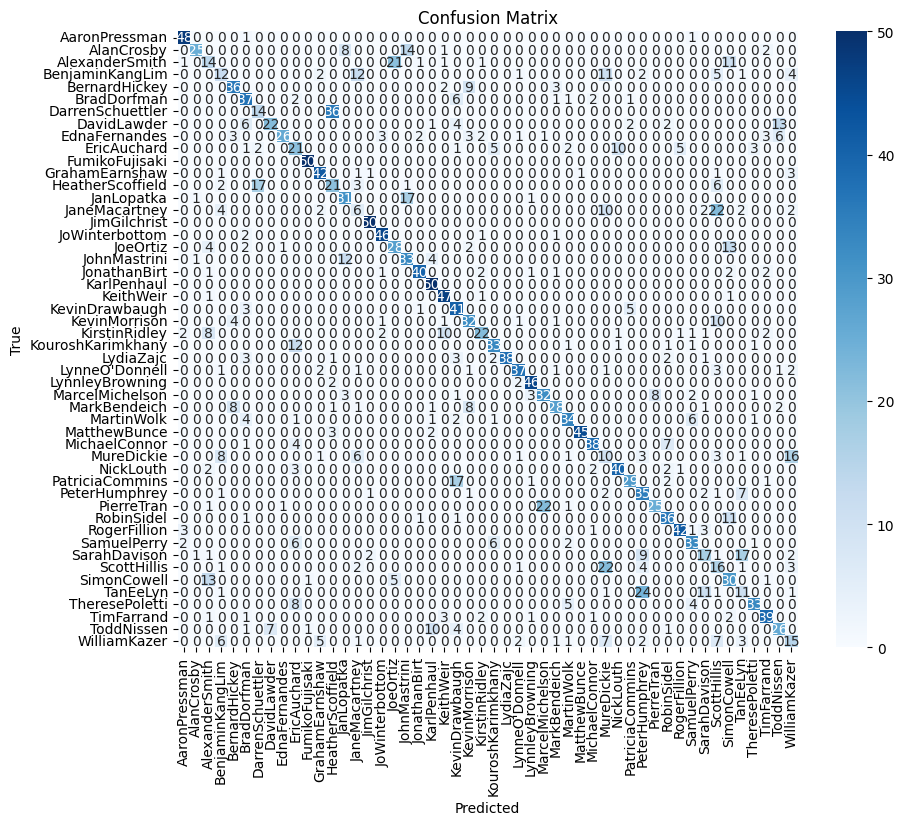

Epoch: 190, Loss: 0.5263, Test Accuracy: 0.6248

Full Test Set Predictions:
Index: 2500, True Label: 0, Predicted Label: 0
Index: 2501, True Label: 0, Predicted Label: 0
Index: 2502, True Label: 0, Predicted Label: 0
Index: 2503, True Label: 0, Predicted Label: 0
Index: 2504, True Label: 0, Predicted Label: 0
Index: 2505, True Label: 0, Predicted Label: 0
Index: 2506, True Label: 0, Predicted Label: 0
Index: 2507, True Label: 0, Predicted Label: 0
Index: 2508, True Label: 0, Predicted Label: 0
Index: 2509, True Label: 0, Predicted Label: 0
Index: 2510, True Label: 0, Predicted Label: 0
Index: 2511, True Label: 0, Predicted Label: 0
Index: 2512, True Label: 0, Predicted Label: 0
Index: 2513, True Label: 0, Predicted Label: 0
Index: 2514, True Label: 0, Predicted Label: 0
Index: 2515, True Label: 0, Predicted Label: 0
Index: 2516, True Label: 0, Predicted Label: 0
Index: 2517, True Label: 0, Predicted Label: 0
Index: 2518, True Label: 0, Predicted Label: 0
Index: 2519, True Label: 0, Pre

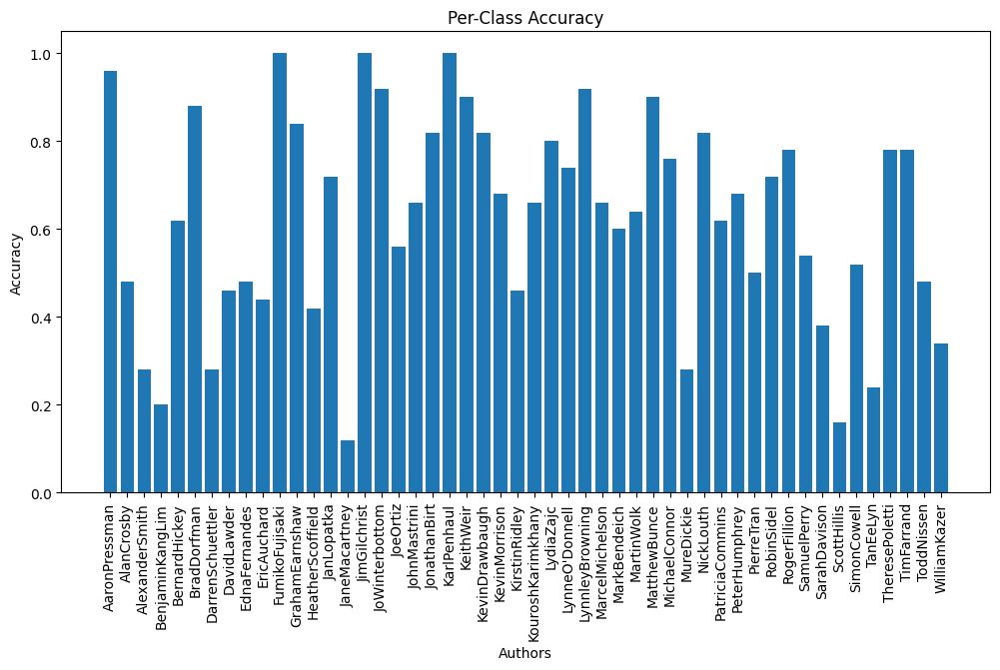

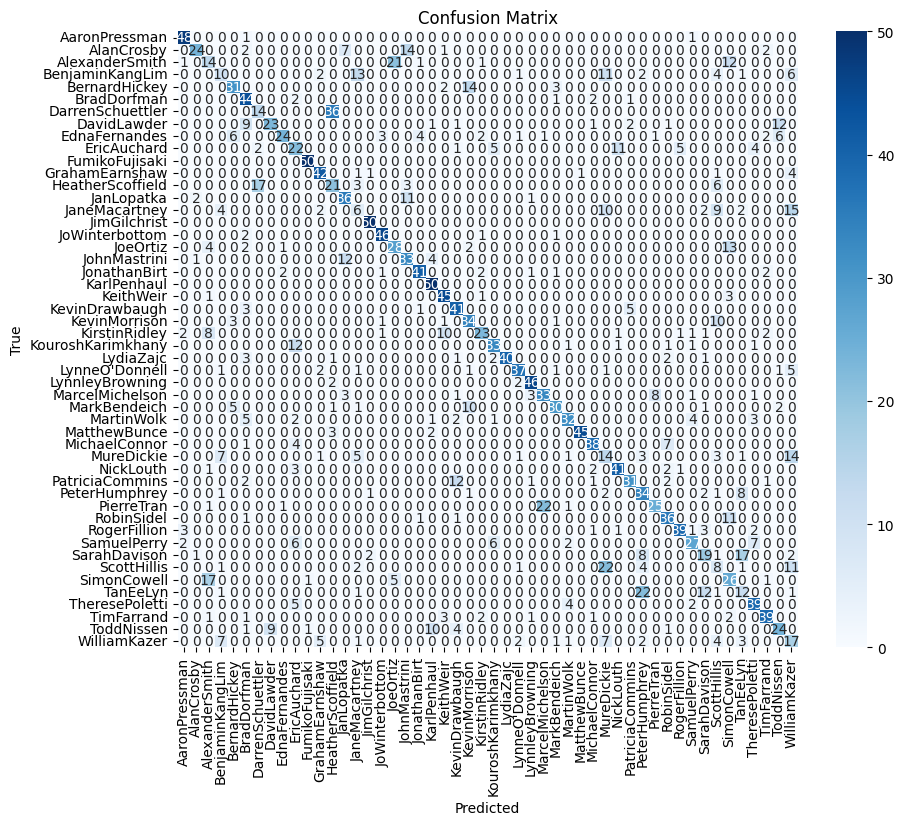

Final Test Accuracy: 0.6260


In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(data, pred):
    cm = confusion_matrix(data.y[data.test_mask].cpu(), pred[data.test_mask].cpu())
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

# Set up the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()

# Training function
def train():
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

# Testing function with full predictions visualization
def test():
    model.eval()
    _, pred = model(data).max(dim=1)
    correct = int(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
    acc = correct / int(data.test_mask.sum())
    
    # Print full predictions for the test set
    print("\nFull Test Set Predictions:")
    test_indices = data.test_mask.nonzero(as_tuple=True)[0]
    for idx in test_indices:
        true_label = data.y[idx].item()
        predicted_label = pred[idx].item()
        print(f"Index: {idx}, True Label: {true_label}, Predicted Label: {predicted_label}")

    per_class_accuracy(data, pred)
    plot_confusion_matrix(data, pred)
    
    return acc

# Training loop
epochs = 200
for epoch in range(epochs):
    loss = train()
    if epoch % 10 == 0:
        test_acc = test()  # No need to print sample predictions, so we call the full prediction test function
        print(f'Epoch: {epoch}, Loss: {loss:.4f}, Test Accuracy: {test_acc:.4f}')

# Final evaluation with full predictions
test_acc = test()  # Print full predictions for the test set at the end
print(f'Final Test Accuracy: {test_acc:.4f}')

def per_class_accuracy(data, pred):
    class_correct = np.zeros(len(label_encoder.classes_))
    class_total = np.zeros(len(label_encoder.classes_))
    
    for i in range(len(data.y[data.test_mask])):
        label = data.y[data.test_mask][i].item()
        class_total[label] += 1
        if pred[data.test_mask][i].item() == label:
            class_correct[label] += 1

    class_accuracy = class_correct / class_total
    
    plt.figure(figsize=(12, 6))
    plt.bar(range(len(label_encoder.classes_)), class_accuracy, tick_label=label_encoder.classes_)
    plt.xlabel('Authors')
    plt.ylabel('Accuracy')
    plt.title('Per-Class Accuracy')
    plt.xticks(rotation=90)
    plt.show()

    return class_accuracy

# Calculate and visualize per-class accuracy



In [33]:
def top_k_accuracy(data, k=5):
    model.eval()
    out = model(data)
    topk_pred = out.topk(k, dim=1).indices
    correct = 0
    
    for i in range(len(data.y[data.test_mask])):
        if data.y[data.test_mask][i].item() in topk_pred[data.test_mask][i].cpu().numpy():
            correct += 1
    
    acc = correct / int(data.test_mask.sum())
    print(f'Top-{k} Accuracy: {acc:.4f}')
    return acc

# Calculate and print Top-5 Accuracy
top_k_accuracy(data, k=5)


Top-5 Accuracy: 0.9420


0.942

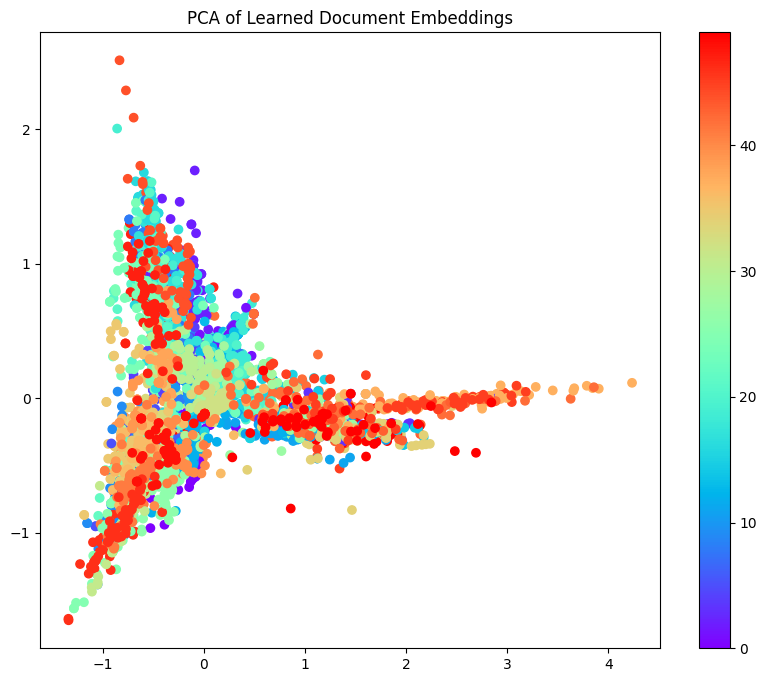

In [24]:



# Visualize the learned embeddings using PCA
model.eval()
embeddings = model.conv1(data.x, data.edge_index).detach().numpy()

pca = PCA(n_components=2)
pca_result = pca.fit_transform(embeddings)

plt.figure(figsize=(10, 8))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=data.y, cmap='rainbow')
plt.colorbar()
plt.title("PCA of Learned Document Embeddings")
plt.show()


## Things to Try

- Add more layers, dropout, optimize GCN
- play with threshold or choose a different metric than cosine similarity
- implement embeddings or different vectorization maybe word2vec or BERT
- could try an ensemble method with svm
- could try GAT or combining with LSTM

### First just trying a GAT layer

In [37]:
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, GATConv

class ImprovedGCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim1, hidden_dim2, output_dim, use_gat=False):
        super(ImprovedGCN, self).__init__()
        self.use_gat = use_gat
        
        if use_gat:
            self.conv1 = GATConv(input_dim, hidden_dim1, heads=8, concat=True)
            self.conv2 = GATConv(hidden_dim1 * 8, hidden_dim2, heads=8, concat=True)
            self.conv3 = GATConv(hidden_dim2 * 8, output_dim, heads=8, concat=False)
        else:
            self.conv1 = GCNConv(input_dim, hidden_dim1)
            self.conv2 = GCNConv(hidden_dim1, hidden_dim2)
            self.conv3 = GCNConv(hidden_dim2, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        
        x = self.conv2(x, edge_index)
        x = F.relu(x)
        x = F.dropout(x, training=self.training)
        
        x = self.conv3(x, edge_index)
        
        return F.log_softmax(x, dim=1)

# Model parameters
input_dim = data.num_features
hidden_dim1 = 64
hidden_dim2 = 32
output_dim = len(label_encoder.classes_)

# Initialize the improved model (set use_gat=True to use GAT layers)
model = ImprovedGCN(input_dim, hidden_dim1, hidden_dim2, output_dim, use_gat=True)


In [38]:
# Set up the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()

# Training function
def train():
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

# Testing function
def test():
    model.eval()
    _, pred = model(data).max(dim=1)
    correct = int(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
    acc = correct / int(data.test_mask.sum())
    return acc

# Training loop
epochs = 200
for epoch in range(epochs):
    loss = train()
    if epoch % 10 == 0:
        test_acc = test()
        print(f'Epoch: {epoch}, Loss: {loss:.4f}, Test Accuracy: {test_acc:.4f}')

# Final evaluation
test_acc = test()
print(f'Final Test Accuracy: {test_acc:.4f}')


Epoch: 0, Loss: 3.9118, Test Accuracy: 0.1500
Epoch: 10, Loss: 1.6232, Test Accuracy: 0.3560
Epoch: 20, Loss: 0.7443, Test Accuracy: 0.5528
Epoch: 30, Loss: 0.6076, Test Accuracy: 0.5636
Epoch: 40, Loss: 0.5388, Test Accuracy: 0.5668
Epoch: 50, Loss: 0.4903, Test Accuracy: 0.5744
Epoch: 60, Loss: 0.4924, Test Accuracy: 0.5736
Epoch: 70, Loss: 0.4749, Test Accuracy: 0.5788
Epoch: 80, Loss: 0.4522, Test Accuracy: 0.5644
Epoch: 90, Loss: 0.4578, Test Accuracy: 0.5732
Epoch: 100, Loss: 0.4606, Test Accuracy: 0.5788
Epoch: 110, Loss: 0.4587, Test Accuracy: 0.5752
Epoch: 120, Loss: 0.4379, Test Accuracy: 0.5652
Epoch: 130, Loss: 0.4449, Test Accuracy: 0.5668
Epoch: 140, Loss: 0.4400, Test Accuracy: 0.5836
Epoch: 150, Loss: 0.4559, Test Accuracy: 0.5684
Epoch: 160, Loss: 0.4329, Test Accuracy: 0.5668
Epoch: 170, Loss: 0.4357, Test Accuracy: 0.5756
Epoch: 180, Loss: 0.4409, Test Accuracy: 0.5656
Epoch: 190, Loss: 0.4383, Test Accuracy: 0.5836
Final Test Accuracy: 0.5632


### Now trying with different cosine similarity threshold for graph creation

In [40]:
import os
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import from_networkx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import numpy as np
import random
import time

def load_data(root_dir, sample_size=10):
    texts = []
    labels = []
    author_folders = os.listdir(root_dir)
    
    for author in author_folders:
        author_dir = os.path.join(root_dir, author)
        files = os.listdir(author_dir)
        sampled_files = random.sample(files, sample_size)
        
        for filename in sampled_files:
            with open(os.path.join(author_dir, filename), 'r', encoding='latin-1') as file:
                texts.append(file.read())
                labels.append(author)
    
    return texts, labels

# Sample 10 articles from each author's train and test set
train_texts, train_labels = load_data('data/ReutersC50/C50train', sample_size=10)
test_texts, test_labels = load_data('data/ReutersC50/C50test', sample_size=10)

# Combine train and test data
all_texts = train_texts + test_texts
all_labels = train_labels + test_labels

# Encode labels
label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(all_labels)

# Extract TF-IDF features
vectorizer = TfidfVectorizer(max_features=5000)
features = vectorizer.fit_transform(all_texts)


In [41]:

# Create the graph
G_new_thresh = nx.Graph()

# Add nodes to the graph
print("Adding nodes to the graph...")
start_time = time.time()

for i in range(features.shape[0]):
    G_new_thresh.add_node(i, feature=features[i], label=labels[i])

end_time = time.time()
print(f"Nodes added: {features.shape[0]} nodes in {end_time - start_time:.2f} seconds.")

# Add edges based on cosine similarity with a threshold of 0.7
print("Adding edges to the graph based on cosine similarity...")
start_time = time.time()

threshold = 0.7  # Adjusted threshold
total_comparisons = (features.shape[0] * (features.shape[0] - 1)) // 2
comparison_count = 0

for i in range(features.shape[0]):
    for j in range(i + 1, features.shape[0]):
        similarity = cosine_similarity(features[i], features[j])[0][0]
        if similarity > threshold:
            G_new_thresh.add_edge(i, j, weight=similarity)
        comparison_count += 1
        
        # Progress updates
        if comparison_count % 100000 == 0:
            elapsed_time = time.time() - start_time
            print(f"Processed {comparison_count}/{total_comparisons} comparisons "
                  f"({(comparison_count / total_comparisons) * 100:.2f}%) "
                  f"in {elapsed_time:.2f} seconds.")

end_time = time.time()
print(f"Edges added in {end_time - start_time:.2f} seconds.")


Adding nodes to the graph...
Nodes added: 1000 nodes in 0.13 seconds.
Adding edges to the graph based on cosine similarity...
Processed 100000/499500 comparisons (20.02%) in 72.34 seconds.
Processed 200000/499500 comparisons (40.04%) in 143.47 seconds.
Processed 300000/499500 comparisons (60.06%) in 218.98 seconds.
Processed 400000/499500 comparisons (80.08%) in 296.64 seconds.
Edges added in 376.69 seconds.


In [42]:


# List of thresholds to test
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]

# Dictionary to hold graphs for each threshold
graphs = {}

# Create and store graphs for each threshold
for threshold in thresholds:
    G1 = nx.Graph()
    
    print(f"\nCreating graph with threshold: {threshold}")
    
    # Add nodes to the graph
    print("Adding nodes to the graph...")
    start_time = time.time()
    
    for i in range(features.shape[0]):
        G1.add_node(i, feature=features[i], label=labels[i])
    
    end_time = time.time()
    print(f"Nodes added: {features.shape[0]} nodes in {end_time - start_time:.2f} seconds.")
    
    # Add edges based on cosine similarity
    print(f"Adding edges to the graph based on cosine similarity with threshold {threshold}...")
    start_time = time.time()
    
    total_comparisons = (features.shape[0] * (features.shape[0] - 1)) // 2
    comparison_count = 0
    
    for i in range(features.shape[0]):
        for j in range(i + 1, features.shape[0]):
            similarity = cosine_similarity(features[i], features[j])[0][0]
            if similarity > threshold:
                G1.add_edge(i, j, weight=similarity)
            comparison_count += 1
            
            # Progress updates
            if comparison_count % 100000 == 0:
                elapsed_time = time.time() - start_time
                print(f"Processed {comparison_count}/{total_comparisons} comparisons "
                      f"({(comparison_count / total_comparisons) * 100:.2f}%) "
                      f"in {elapsed_time:.2f} seconds.")
    
    end_time = time.time()
    print(f"Edges added in {end_time - start_time:.2f} seconds.")
    
    # Store the graph in the dictionary
    graphs[threshold] = G1

# Example of how to access and use the graphs
for threshold, graph in graphs.items():
    print(f"\nGraph for threshold {threshold} has {graph.number_of_nodes()} nodes and {graph.number_of_edges()} edges.")



Creating graph with threshold: 0.3
Adding nodes to the graph...
Nodes added: 1000 nodes in 0.09 seconds.
Adding edges to the graph based on cosine similarity with threshold 0.3...
Processed 100000/499500 comparisons (20.02%) in 71.06 seconds.
Processed 200000/499500 comparisons (40.04%) in 141.74 seconds.
Processed 300000/499500 comparisons (60.06%) in 212.61 seconds.
Processed 400000/499500 comparisons (80.08%) in 284.04 seconds.
Edges added in 354.95 seconds.

Creating graph with threshold: 0.4
Adding nodes to the graph...
Nodes added: 1000 nodes in 0.07 seconds.
Adding edges to the graph based on cosine similarity with threshold 0.4...
Processed 100000/499500 comparisons (20.02%) in 70.37 seconds.
Processed 200000/499500 comparisons (40.04%) in 140.99 seconds.
Processed 300000/499500 comparisons (60.06%) in 212.29 seconds.
Processed 400000/499500 comparisons (80.08%) in 282.96 seconds.
Edges added in 353.43 seconds.

Creating graph with threshold: 0.5
Adding nodes to the graph...
N

In [49]:
def train_and_evaluate(threshold, graph):
    print(f"\nTraining model for graph with threshold: {threshold}")
    
    # Convert the NetworkX graph to a PyTorch Geometric data object
    data = from_networkx(graph)
    data.x = torch.tensor(features.todense(), dtype=torch.float)
    data.y = torch.tensor(labels, dtype=torch.long)

    # Set up train and test masks
    data.train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
    data.train_mask[:len(train_texts)] = 1
    data.test_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
    data.test_mask[len(train_texts):] = 1

    # Define the GCN model
    class GCN(torch.nn.Module):
        def __init__(self, input_dim, hidden_dim, output_dim):
            super(GCN, self).__init__()
            self.conv1 = GCNConv(input_dim, hidden_dim)
            self.conv2 = GCNConv(hidden_dim, output_dim)

        def forward(self, data):
            x, edge_index = data.x, data.edge_index
            x = self.conv1(x, edge_index)
            x = torch.relu(x)
            x = torch.nn.functional.dropout(x, training=self.training)
            x = self.conv2(x, edge_index)
            return torch.log_softmax(x, dim=1)

    # Model parameters
    input_dim = data.num_features
    hidden_dim = 64
    output_dim = len(label_encoder.classes_)

    # Initialize model
    model = GCN(input_dim, hidden_dim, output_dim)

    # Set up the optimizer and loss function
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
    criterion = torch.nn.CrossEntropyLoss()

    # Training function
    def train():
        model.train()
        optimizer.zero_grad()
        out = model(data)
        loss = criterion(out[data.train_mask], data.y[data.train_mask])
        loss.backward()
        optimizer.step()
        return loss.item()

    # Testing function
    def test():
        model.eval()
        _, pred = model(data).max(dim=1)
        correct = int(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
        acc = correct / int(data.test_mask.sum())
        return acc

    # Training loop
    epochs = 200  # Reduce epochs for faster testing
    best_acc = 0
    for epoch in range(epochs):
        loss = train()
        if epoch % 10 == 0:
            test_acc = test()
            print(f'Epoch: {epoch}, Loss: {loss:.4f}, Test Accuracy: {test_acc:.4f}')
            best_acc = max(best_acc, test_acc)
    
    return best_acc

# Evaluate each graph and find the best threshold
best_threshold = None
best_accuracy = 0

for threshold, graph in graphs.items():
    accuracy = train_and_evaluate(threshold, graph)
    print(f"Threshold {threshold} achieved an accuracy of {accuracy:.4f}")
    
    if accuracy > best_accuracy:
        best_accuracy = accuracy
        best_threshold = threshold

print(f"\nBest Threshold: {best_threshold} with Test Accuracy: {best_accuracy:.4f}")


Training model for graph with threshold: 0.3
Epoch: 0, Loss: 3.9119, Test Accuracy: 0.1540
Epoch: 10, Loss: 3.2449, Test Accuracy: 0.2900
Epoch: 20, Loss: 2.2944, Test Accuracy: 0.4080
Epoch: 30, Loss: 1.7241, Test Accuracy: 0.4300
Epoch: 40, Loss: 1.4987, Test Accuracy: 0.4400
Epoch: 50, Loss: 1.3407, Test Accuracy: 0.4400
Epoch: 60, Loss: 1.2497, Test Accuracy: 0.4400
Epoch: 70, Loss: 1.2014, Test Accuracy: 0.4520
Epoch: 80, Loss: 1.1345, Test Accuracy: 0.4540
Epoch: 90, Loss: 1.1054, Test Accuracy: 0.4560
Epoch: 100, Loss: 1.0854, Test Accuracy: 0.4620
Epoch: 110, Loss: 1.0622, Test Accuracy: 0.4560
Epoch: 120, Loss: 1.0402, Test Accuracy: 0.4460
Epoch: 130, Loss: 1.0227, Test Accuracy: 0.4520
Epoch: 140, Loss: 0.9967, Test Accuracy: 0.4660
Epoch: 150, Loss: 1.0252, Test Accuracy: 0.4700
Epoch: 160, Loss: 0.9875, Test Accuracy: 0.4660
Epoch: 170, Loss: 0.9683, Test Accuracy: 0.4560
Epoch: 180, Loss: 0.9848, Test Accuracy: 0.4540
Epoch: 190, Loss: 0.9720, Test Accuracy: 0.4640
Thres

So let's try threshold .7 on the full set

In [3]:
import os
import torch
import networkx as nx
import matplotlib.pyplot as plt
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from torch_geometric.utils import from_networkx
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
import numpy as np

def load_data(root_dir):
    texts = []
    labels = []
    author_folders = os.listdir(root_dir)
    
    for author in author_folders:
        author_dir = os.path.join(root_dir, author)
        for filename in os.listdir(author_dir):
            with open(os.path.join(author_dir, filename), 'r', encoding='latin-1') as file:
                texts.append(file.read())
                labels.append(author)
    
    return texts, labels

train_texts, train_labels = load_data('data/ReutersC50/C50train')
test_texts, test_labels = load_data('data/ReutersC50/C50test')


all_texts = train_texts + test_texts
all_labels = train_labels + test_labels

label_encoder = LabelEncoder()
labels = label_encoder.fit_transform(all_labels)

vectorizer = TfidfVectorizer(max_features=5000)
features = vectorizer.fit_transform(all_texts)

In [4]:
import time


G_7 = nx.Graph()


print("Adding nodes to the graph...")
start_time = time.time()

for i in range(features.shape[0]):
    G_7.add_node(i, feature=features[i], label=labels[i])

end_time = time.time()
print(f"Nodes added: {features.shape[0]} nodes in {end_time - start_time:.2f} seconds.")

## We want to add edges based on cosine similarity
print("Adding edges to the graph based on cosine similarity...")
start_time = time.time()

threshold = 0.7 
total_comparisons = (features.shape[0] * (features.shape[0] - 1)) // 2
comparison_count = 0

for i in range(features.shape[0]):
    for j in range(i + 1, features.shape[0]):
        similarity = cosine_similarity(features[i], features[j])[0][0]
        if similarity > threshold:
            G_7.add_edge(i, j, weight=similarity)
        comparison_count += 1
        
        ## Just wanted progress updates
        if comparison_count % 100000 == 0:
            elapsed_time = time.time() - start_time
            print(f"Processed {comparison_count}/{total_comparisons} comparisons "
                  f"({(comparison_count / total_comparisons) * 100:.2f}%) "
                  f"in {elapsed_time:.2f} seconds.")

end_time = time.time()
print(f"Edges added in {end_time - start_time:.2f} seconds.")


Adding nodes to the graph...
Nodes added: 5000 nodes in 0.30 seconds.
Adding edges to the graph based on cosine similarity...
Processed 100000/12497500 comparisons (0.80%) in 69.31 seconds.
Processed 200000/12497500 comparisons (1.60%) in 137.00 seconds.
Processed 300000/12497500 comparisons (2.40%) in 205.22 seconds.
Processed 400000/12497500 comparisons (3.20%) in 272.74 seconds.
Processed 500000/12497500 comparisons (4.00%) in 340.64 seconds.
Processed 600000/12497500 comparisons (4.80%) in 409.15 seconds.
Processed 700000/12497500 comparisons (5.60%) in 479.09 seconds.
Processed 800000/12497500 comparisons (6.40%) in 546.96 seconds.
Processed 900000/12497500 comparisons (7.20%) in 614.90 seconds.
Processed 1000000/12497500 comparisons (8.00%) in 682.51 seconds.
Processed 1100000/12497500 comparisons (8.80%) in 750.93 seconds.
Processed 1200000/12497500 comparisons (9.60%) in 818.62 seconds.
Processed 1300000/12497500 comparisons (10.40%) in 887.75 seconds.
Processed 1400000/1249750

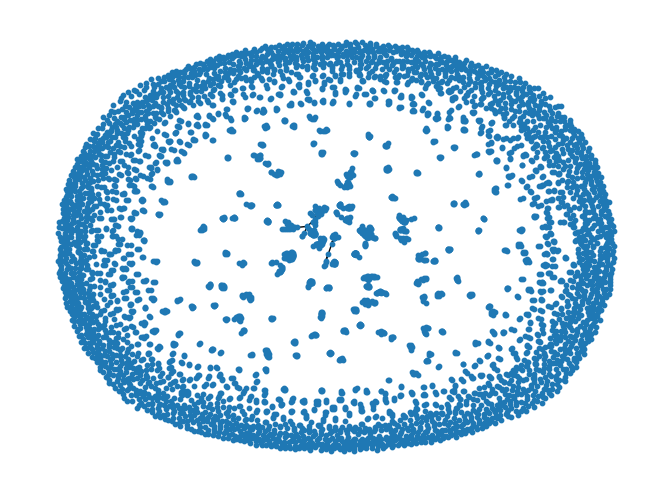

In [5]:

nx.draw(G_7, node_size=10, with_labels=False)
plt.show()

In [6]:
print(f"Total number of edges in the graph: {G_7.number_of_edges()}")

print("\nFirst 100 edge weights:")
for i, (u, v, attr) in enumerate(G_7.edges(data=True)):
    if i < 100:  # Limit to the first 100 edges
        print(f"Edge ({u}, {v}) - Weight: {attr['weight']:.4f}")
    else:
        break

Total number of edges in the graph: 5171

First 100 edge weights:
Edge (3, 4) - Weight: 0.9272
Edge (9, 11) - Weight: 0.9984
Edge (14, 47) - Weight: 0.7041
Edge (18, 23) - Weight: 0.7034
Edge (19, 23) - Weight: 0.7906
Edge (19, 24) - Weight: 0.9440
Edge (21, 22) - Weight: 0.9381
Edge (23, 24) - Weight: 0.8176
Edge (30, 47) - Weight: 0.8200
Edge (31, 32) - Weight: 0.9923
Edge (36, 37) - Weight: 0.9708
Edge (41, 43) - Weight: 0.9785
Edge (41, 44) - Weight: 0.9988
Edge (43, 44) - Weight: 0.9795
Edge (51, 54) - Weight: 0.9941
Edge (52, 53) - Weight: 0.9253
Edge (59, 61) - Weight: 0.7193
Edge (60, 61) - Weight: 0.7503
Edge (61, 62) - Weight: 0.7838
Edge (63, 64) - Weight: 0.8625
Edge (63, 65) - Weight: 0.9621
Edge (64, 65) - Weight: 0.8641
Edge (68, 69) - Weight: 0.9845
Edge (70, 71) - Weight: 0.9627
Edge (70, 2568) - Weight: 0.8139
Edge (70, 2571) - Weight: 0.8094
Edge (71, 2568) - Weight: 0.7840
Edge (71, 2571) - Weight: 0.7854
Edge (72, 73) - Weight: 0.9265
Edge (72, 96) - Weight: 0.7567

In [7]:
from torch_geometric.utils import from_networkx
import torch

# Convert the NetworkX graph to a PyTorch Geometric data object
data = from_networkx(G_7)

# Assuming 'features' is a matrix with document embeddings (e.g., BERT embeddings)
data.x = torch.tensor(features.todense(), dtype=torch.float)
data.y = torch.tensor(labels, dtype=torch.long)

# Set up train and test masks
data.train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.train_mask[:len(train_texts)] = 1
data.test_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.test_mask[len(train_texts):] = 1


In [8]:
from torch_geometric.nn import GCNConv

class GCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)
        return torch.log_softmax(x, dim=1)


In [9]:
# Model parameters
input_dim = data.num_features
hidden_dim = 64
output_dim = len(label_encoder.classes_)

# Initialize model
model = GCN(input_dim, hidden_dim, output_dim)

# Set up the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()


In [19]:
# Training function
def train():
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

# Testing function with predictions inspection
# Testing function with top-5 accuracy
def test():
    model.eval()
    out = model(data)
    _, top5_pred = out.topk(5, dim=1)  # Get the top 5 predictions for each document
    
    correct = int(top5_pred[data.test_mask].eq(data.y[data.test_mask].view(-1, 1)).sum().item())
    acc = correct / int(data.test_mask.sum())
    
    # For top-1 accuracy
    _, pred = out.max(dim=1)
    top1_correct = int(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
    top1_acc = top1_correct / int(data.test_mask.sum())
    
    return top1_acc, acc, pred



In [21]:
# Training loop
epochs = 500  # Adjust number of epochs as needed
best_top1_acc = 0  # Track the best top-1 accuracy
best_top5_acc = 0  # Track the best top-5 accuracy

for epoch in range(epochs):
    loss = train()
    if epoch % 10 == 0:
        top1_acc, top5_acc, _ = test()
        print(f'Epoch: {epoch}, Loss: {loss:.4f}, Top-1 Accuracy: {top1_acc:.4f}, Top-5 Accuracy: {top5_acc:.4f}')
        
        # Optionally, save the model if it achieves a new best accuracy
        if top1_acc > best_top1_acc:
            best_top1_acc = top1_acc
            torch.save(model.state_dict(), 'best_model_top1.pth')
        if top5_acc > best_top5_acc:
            best_top5_acc = top5_acc
            torch.save(model.state_dict(), 'best_model_top5.pth')

# Final evaluation
top1_acc, top5_acc, pred = test()
print(f'Final Top-1 Accuracy: {top1_acc:.4f}')
print(f'Final Top-5 Accuracy: {top5_acc:.4f}')



Epoch: 0, Loss: 0.2965, Top-1 Accuracy: 0.6836, Top-5 Accuracy: 0.9640
Epoch: 10, Loss: 0.2944, Top-1 Accuracy: 0.6792, Top-5 Accuracy: 0.9640
Epoch: 20, Loss: 0.3001, Top-1 Accuracy: 0.6860, Top-5 Accuracy: 0.9676
Epoch: 30, Loss: 0.3001, Top-1 Accuracy: 0.6844, Top-5 Accuracy: 0.9640
Epoch: 40, Loss: 0.3003, Top-1 Accuracy: 0.6844, Top-5 Accuracy: 0.9648
Epoch: 50, Loss: 0.2950, Top-1 Accuracy: 0.6840, Top-5 Accuracy: 0.9644
Epoch: 60, Loss: 0.2924, Top-1 Accuracy: 0.6848, Top-5 Accuracy: 0.9644
Epoch: 70, Loss: 0.2932, Top-1 Accuracy: 0.6812, Top-5 Accuracy: 0.9660
Epoch: 80, Loss: 0.2911, Top-1 Accuracy: 0.6844, Top-5 Accuracy: 0.9664
Epoch: 90, Loss: 0.2924, Top-1 Accuracy: 0.6764, Top-5 Accuracy: 0.9644
Epoch: 100, Loss: 0.2951, Top-1 Accuracy: 0.6812, Top-5 Accuracy: 0.9640
Epoch: 110, Loss: 0.2925, Top-1 Accuracy: 0.6848, Top-5 Accuracy: 0.9636
Epoch: 120, Loss: 0.3018, Top-1 Accuracy: 0.6812, Top-5 Accuracy: 0.9656
Epoch: 130, Loss: 0.2956, Top-1 Accuracy: 0.6756, Top-5 Accura

Final Top-1 Accuracy: 0.6816
Final Top-5 Accuracy: 0.9640


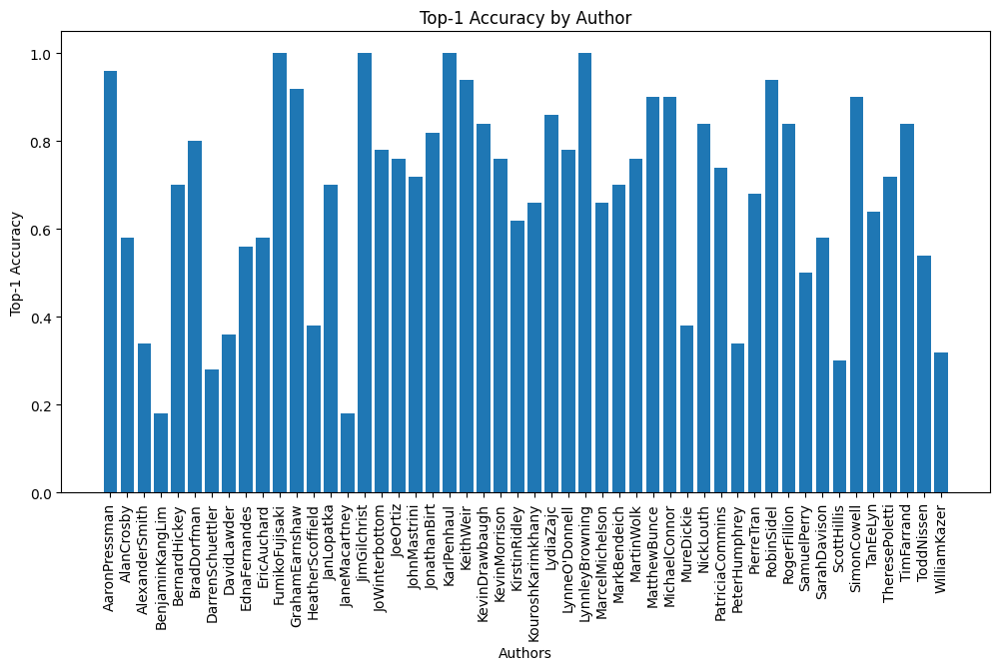

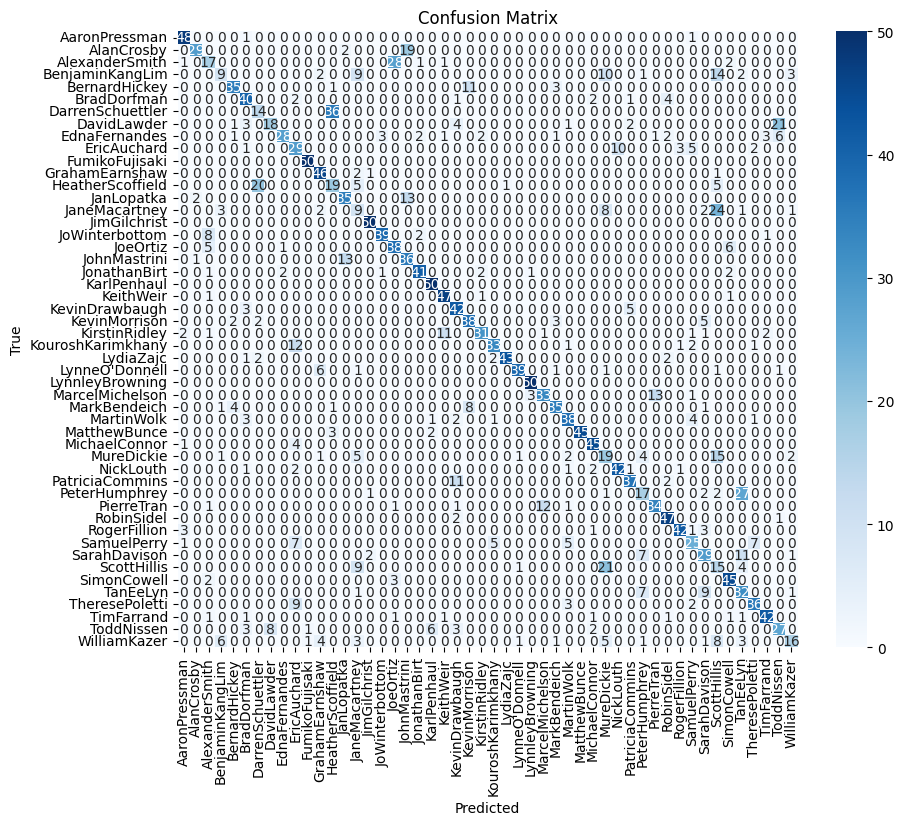

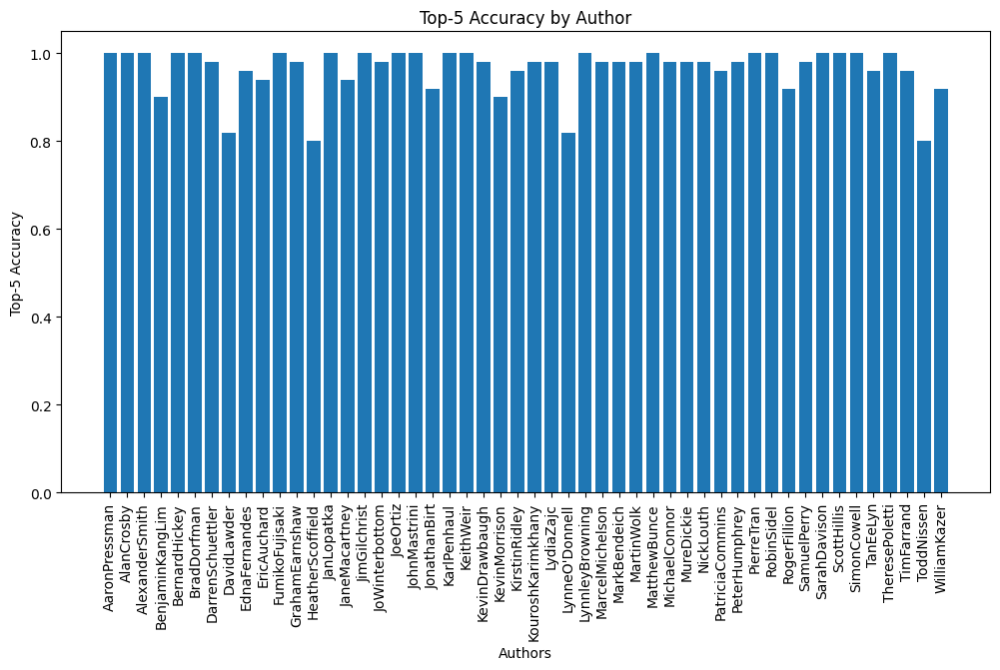

In [22]:
# Final evaluation with detailed analysis including top-5 accuracy
top1_acc, top5_acc, pred = test()
print(f'Final Top-1 Accuracy: {top1_acc:.4f}')
print(f'Final Top-5 Accuracy: {top5_acc:.4f}')

# Accuracy by Author (Top-1)
author_correct = np.zeros(len(label_encoder.classes_))
author_total = np.zeros(len(label_encoder.classes_))

for i in range(len(data.y[data.test_mask])):
    label = data.y[data.test_mask][i].item()
    author_total[label] += 1
    if pred[data.test_mask][i].item() == label:
        author_correct[label] += 1

author_accuracy = author_correct / author_total

plt.figure(figsize=(12, 6))
plt.bar(range(len(label_encoder.classes_)), author_accuracy, tick_label=label_encoder.classes_)
plt.xlabel('Authors')
plt.ylabel('Top-1 Accuracy')
plt.title('Top-1 Accuracy by Author')
plt.xticks(rotation=90)
plt.show()

# Confusion Matrix
cm = confusion_matrix(data.y[data.test_mask].cpu(), pred[data.test_mask].cpu())
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Top-5 Accuracy by Author
top5_author_correct = np.zeros(len(label_encoder.classes_))
top5_pred = model(data).topk(5, dim=1)[1]

for i in range(len(data.y[data.test_mask])):
    label = data.y[data.test_mask][i].item()
    if label in top5_pred[data.test_mask][i]:
        top5_author_correct[label] += 1

top5_author_accuracy = top5_author_correct / author_total

plt.figure(figsize=(12, 6))
plt.bar(range(len(label_encoder.classes_)), top5_author_accuracy, tick_label=label_encoder.classes_)
plt.xlabel('Authors')
plt.ylabel('Top-5 Accuracy')
plt.title('Top-5 Accuracy by Author')
plt.xticks(rotation=90)
plt.show()


Trying to use something other than TF-IDF, first I'll try BERT

In [52]:
from transformers import BertTokenizer, BertModel
import torch
import numpy as np

# Load pretrained BERT model and tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertModel.from_pretrained('bert-base-uncased')

def get_bert_embedding(text):
    inputs = tokenizer(text, return_tensors='pt', truncation=True, padding=True, max_length=512)
    with torch.no_grad():
        outputs = model(**inputs)
    # Use the [CLS] token or mean of the last hidden state for document representation
    embedding = outputs.last_hidden_state.mean(dim=1).squeeze().numpy()
    return embedding

# Apply this to all documents
document_embeddings = np.array([get_bert_embedding(doc) for doc in all_texts])


In [61]:
import networkx as nx
from sklearn.metrics.pairwise import cosine_similarity
import time

# Create a graph
G_bert = nx.Graph()

# Add nodes to the graph (each document is a node)
print("Adding nodes to the graph...")
start_time = time.time()

for i in range(document_embeddings.shape[0]):
    G_bert.add_node(i, feature=document_embeddings[i], label=labels[i])

end_time = time.time()
print(f"Nodes added: {document_embeddings.shape[0]} nodes in {end_time - start_time:.2f} seconds.")

# Add edges based on cosine similarity with a specific threshold
threshold = 0.9  # You can adjust this threshold
print("Adding edges to the graph based on cosine similarity...")
start_time = time.time()

total_comparisons = (document_embeddings.shape[0] * (document_embeddings.shape[0] - 1)) // 2
comparison_count = 0

for i in range(document_embeddings.shape[0]):
    for j in range(i + 1, document_embeddings.shape[0]):
        similarity = cosine_similarity([document_embeddings[i]], [document_embeddings[j]])[0][0]
        if similarity > threshold:
            G_bert.add_edge(i, j, weight=similarity)
        comparison_count += 1
        
        # Progress updates
        if comparison_count % 100000 == 0:
            elapsed_time = time.time() - start_time
            print(f"Processed {comparison_count}/{total_comparisons} comparisons "
                  f"({(comparison_count / total_comparisons) * 100:.2f}%) "
                  f"in {elapsed_time:.2f} seconds.")

end_time = time.time()
print(f"Edges added in {end_time - start_time:.2f} seconds.")


Adding nodes to the graph...
Nodes added: 1000 nodes in 0.00 seconds.
Adding edges to the graph based on cosine similarity...
Processed 100000/499500 comparisons (20.02%) in 34.35 seconds.
Processed 200000/499500 comparisons (40.04%) in 68.25 seconds.
Processed 300000/499500 comparisons (60.06%) in 104.33 seconds.
Processed 400000/499500 comparisons (80.08%) in 138.85 seconds.
Edges added in 172.99 seconds.


In [62]:
from torch_geometric.utils import from_networkx
import torch

# Convert the NetworkX graph to a PyTorch Geometric data object
data = from_networkx(G_bert)
data.x = torch.tensor(document_embeddings, dtype=torch.float)
data.y = torch.tensor(labels, dtype=torch.long)

# Set up train and test masks
data.train_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.train_mask[:len(train_texts)] = 1
data.test_mask = torch.zeros(data.num_nodes, dtype=torch.bool)
data.test_mask[len(train_texts):] = 1


In [65]:
from torch_geometric.nn import GCNConv

# Define the GCN model
class GCN(torch.nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = torch.nn.functional.dropout(x, training=self.training)
        x = self.conv2(x, edge_index)
        return torch.log_softmax(x, dim=1)

# Model parameters
input_dim = data.num_features
hidden_dim = 64
output_dim = len(label_encoder.classes_)

# Initialize model
model = GCN(input_dim, hidden_dim, output_dim)

# Set up the optimizer and loss function
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
criterion = torch.nn.CrossEntropyLoss()

# Training function
def train():
    model.train()
    optimizer.zero_grad()
    out = model(data)
    loss = criterion(out[data.train_mask], data.y[data.train_mask])
    loss.backward()
    optimizer.step()
    return loss.item()

# Testing function
def test():
    model.eval()
    _, pred = model(data).max(dim=1)
    correct = int(pred[data.test_mask].eq(data.y[data.test_mask]).sum().item())
    acc = correct / int(data.test_mask.sum())
    return acc

# Training loop
epochs = 1000  # Adjust number of epochs as needed
for epoch in range(epochs):
    loss = train()
    if epoch % 10 == 0:
        test_acc = test()
        print(f'Epoch: {epoch}, Loss: {loss:.4f}, Test Accuracy: {test_acc:.4f}')

# Final evaluation
test_acc = test()
print(f'Final Test Accuracy: {test_acc:.4f}')


Epoch: 0, Loss: 3.9408, Test Accuracy: 0.0200
Epoch: 10, Loss: 3.7798, Test Accuracy: 0.0600
Epoch: 20, Loss: 3.5137, Test Accuracy: 0.0740
Epoch: 30, Loss: 3.3142, Test Accuracy: 0.0980
Epoch: 40, Loss: 3.1085, Test Accuracy: 0.1340
Epoch: 50, Loss: 2.9346, Test Accuracy: 0.1520
Epoch: 60, Loss: 2.8067, Test Accuracy: 0.1600
Epoch: 70, Loss: 2.7456, Test Accuracy: 0.1760
Epoch: 80, Loss: 2.6634, Test Accuracy: 0.1640
Epoch: 90, Loss: 2.6515, Test Accuracy: 0.1860
Epoch: 100, Loss: 2.5887, Test Accuracy: 0.1940
Epoch: 110, Loss: 2.5755, Test Accuracy: 0.1980
Epoch: 120, Loss: 2.5023, Test Accuracy: 0.1900
Epoch: 130, Loss: 2.4617, Test Accuracy: 0.1960
Epoch: 140, Loss: 2.4309, Test Accuracy: 0.1920
Epoch: 150, Loss: 2.5300, Test Accuracy: 0.1760
Epoch: 160, Loss: 2.4635, Test Accuracy: 0.2060
Epoch: 170, Loss: 2.3769, Test Accuracy: 0.2060
Epoch: 180, Loss: 2.3714, Test Accuracy: 0.1980
Epoch: 190, Loss: 2.3119, Test Accuracy: 0.2160
Epoch: 200, Loss: 2.3567, Test Accuracy: 0.2080
Epo

In [63]:
print(f"Total number of edges in the graph: {G_bert.number_of_edges()}")

print("\nFirst 100 edge weights:")
for i, (u, v, attr) in enumerate(G_bert.edges(data=True)):
    if i < 100:  # Limit to the first 100 edges
        print(f"Edge ({u}, {v}) - Weight: {attr['weight']:.4f}")
    else:
        break

Total number of edges in the graph: 139659

First 100 edge weights:
Edge (0, 1) - Weight: 0.9086
Edge (0, 2) - Weight: 0.9264
Edge (0, 4) - Weight: 0.9279
Edge (0, 5) - Weight: 0.9119
Edge (0, 6) - Weight: 0.9216
Edge (0, 7) - Weight: 0.9227
Edge (0, 8) - Weight: 0.9317
Edge (0, 9) - Weight: 0.9144
Edge (0, 52) - Weight: 0.9187
Edge (0, 75) - Weight: 0.9026
Edge (0, 76) - Weight: 0.9010
Edge (0, 79) - Weight: 0.9001
Edge (0, 91) - Weight: 0.9060
Edge (0, 93) - Weight: 0.9233
Edge (0, 104) - Weight: 0.9041
Edge (0, 210) - Weight: 0.9108
Edge (0, 220) - Weight: 0.9321
Edge (0, 221) - Weight: 0.9095
Edge (0, 223) - Weight: 0.9130
Edge (0, 225) - Weight: 0.9179
Edge (0, 228) - Weight: 0.9041
Edge (0, 242) - Weight: 0.9014
Edge (0, 246) - Weight: 0.9010
Edge (0, 249) - Weight: 0.9012
Edge (0, 280) - Weight: 0.9020
Edge (0, 284) - Weight: 0.9027
Edge (0, 311) - Weight: 0.9036
Edge (0, 330) - Weight: 0.9064
Edge (0, 331) - Weight: 0.9050
Edge (0, 334) - Weight: 0.9070
Edge (0, 335) - Weight: 